# ASSIGNMENT



In [138]:
#import all the necessary packages.

from PIL import Image
from PIL import ImageTk, Image as PILImage
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [139]:
# we have give a json file which consists of all information about
# the products
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')


In [140]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [141]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [142]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [143]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


  # Missing data for various features.

####  Basic stats for the feature: product_type_name

In [144]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].describe())

# 91.62% (167794/183138) of the products are shirts,


count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [145]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [146]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

####  Basic stats for the feature: brand

In [147]:
# there are 10577 unique brands
print(data['brand'].describe())

# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [148]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

####  Basic stats for the feature: color

In [149]:

print(data['color'].describe())




count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [150]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

####  Basic stats for the feature: formatted_price

In [151]:
 
print(data['formatted_price'].describe())



count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [152]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

#### Basic stats for the feature: title


In [153]:
print(data['title'].describe())




count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [154]:
data.to_pickle('pickels/180k_apparel_data')

In [155]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [156]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


#### We brought down the number of data points from 183K  to 28K.

We are processing only 28K points so that most of the workshop participants can run this code on thier laptops in a reasonable amount of time. <br> 

For those of you who have powerful computers and some time to spare, you are recommended to use all of the 183K images.


In [157]:
data.to_pickle('pickels/28k_apparel_data')

### Remove near duplicate items

####  Understand about duplicates.

In [158]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color


2325


####  Remove duplicates 

In [159]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

In [160]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [161]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [162]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


In [163]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [164]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [165]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [166]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [167]:
data.to_pickle('pickels/17k_apperal_data')

####  Remove duplicates 

In [168]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [ ]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [170]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  17593


In [171]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [98]:
data = pd.read_pickle('pickels/16k_apperal_data')

In [99]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'from', 'wouldn', 'and', "isn't", "wasn't", 've', 'if', 'weren', "she's", 'such', 'before', 'during', 'over', 'needn', 'should', 'these', 'we', 'through', 'have', "wouldn't", 'm', 'an', 'd', 'not', 're', 'than', 'you', 'until', 'am', 'but', 'will', 'mustn', "it's", 'shan', 'has', "shan't", 'after', "should've", 'where', 'been', 'what', 'them', 'do', "couldn't", 'for', 'himself', 'who', 'can', 'o', 'him', 'there', 'between', 'having', 'i', 'when', 'didn', 'about', "needn't", 'a', 'had', "didn't", "aren't", 'y', 'me', 'his', "that'll", "mustn't", 'above', "weren't", 'out', 'doing', 'which', 'be', 'are', 'under', "you've", 'ours', 'each', 'itself', 'll', 'own', 'or', 'my', 't', 'with', 'she', 'their', 'theirs', 'its', "you'll", 's', 'ourselves', 'nor', 'more', 'so', 'aren', 'whom', "mightn't", 'here', 'why', 'shouldn', 'our', 'that', 'were', 'only', 'how', 'haven', 'hers', 'the', "haven't", 'herself', 'again', "shouldn't", "don't", 'wasn', 'other', 'don', 'yourselves'

In [100]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

27.851781557309778 seconds


In [101]:

data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [102]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

## Stemming 

In [103]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))


# We tried using stemming on our titles and it didnot work very well. 


argu
fish


#  Text based product similarity

In [123]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [124]:
data=data.head(16042)

In [125]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [126]:
def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)

In [127]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

##  IDF value computation

The below code computes the IDF values for the data[title]

In [128]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])
idf_title_features.shape
# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16042, 12404)

In [129]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

###  IDF weighted Word2Vec for product similarity

In [130]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)
w2v_title_weight.shape

(16042, 300)

###  Weighted similarity using brand and color. 
In the below code we converting the color and brands of the data columns into vectors using Countvectorizer.

In [131]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

# Heat map to display the results

In [132]:

#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = PILImage.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

#  Keras and Tensorflow to extract features

In [133]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

# Weighted similarity using idf weighted word to vec ,color and brand and image

(16042, 1)
(16042, 1)


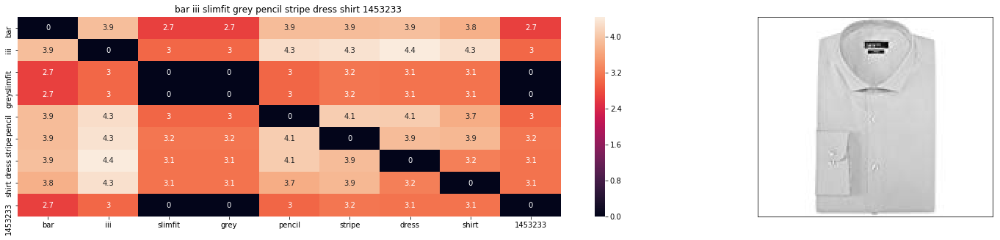

ASIN : B0153H0C7K
Brand : Bar III
euclidean distance from input : 0.00023017798860867819


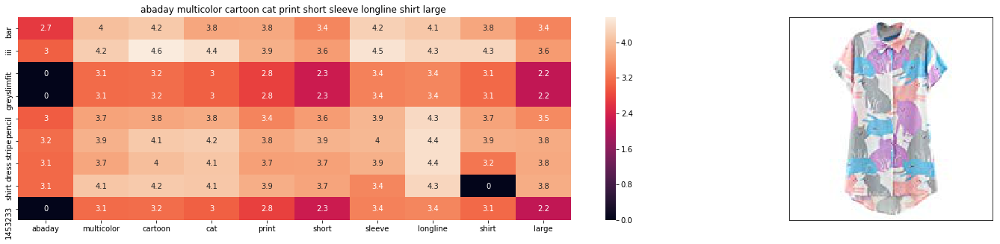

ASIN : B01CR57YY0
Brand : ABADAY
euclidean distance from input : 6.896547508239746


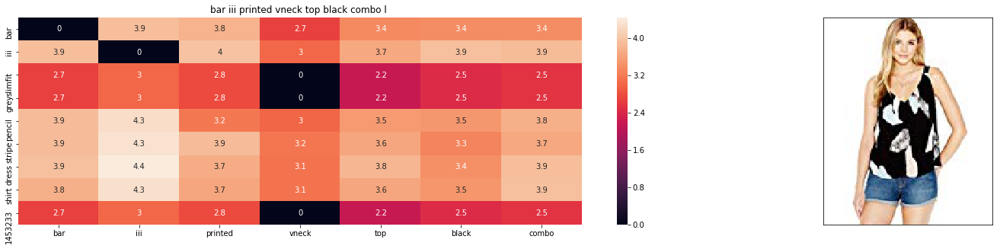

ASIN : B01KI9PNCM
Brand : Bar lll
euclidean distance from input : 10.052600465306796


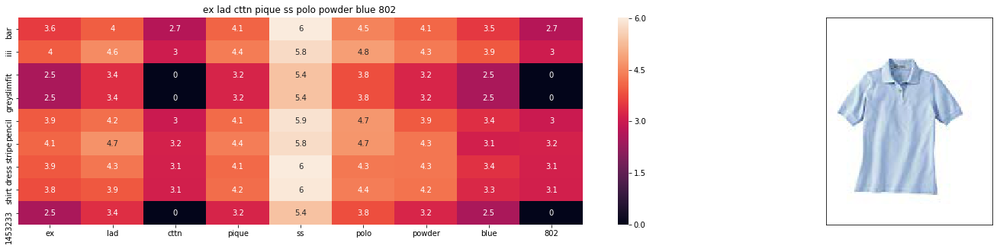

ASIN : B00ELC5OC2
Brand : Ash City
euclidean distance from input : 10.10990835849694


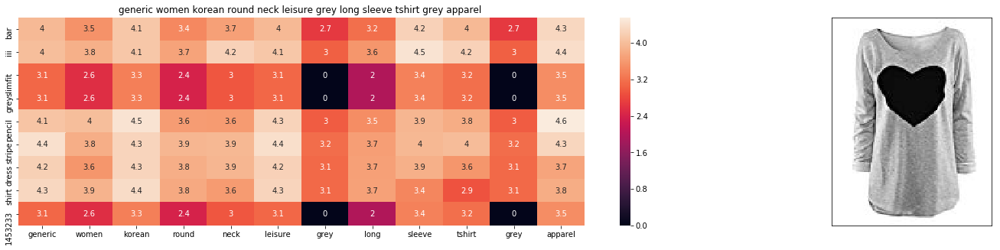

ASIN : B013LL0ENM
Brand : Absolutely
euclidean distance from input : 12.459490304175954


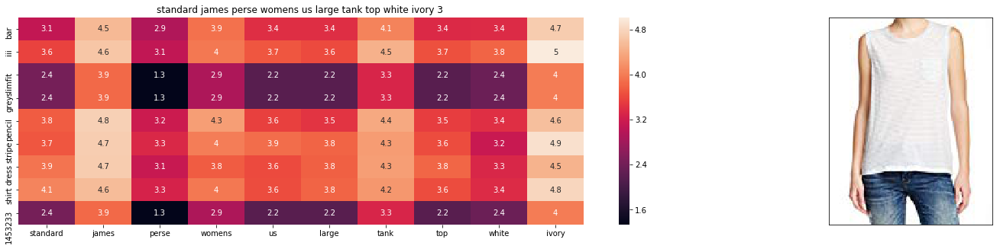

ASIN : B074SV25HV
Brand : Standard James Perse
euclidean distance from input : 13.375864175093561


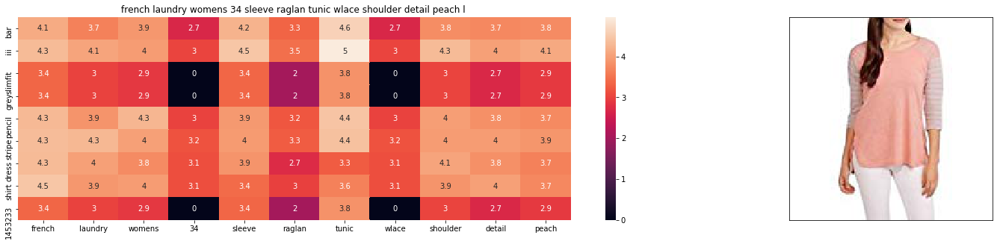

ASIN : B06Y5SZF7B
Brand : French Laundry
euclidean distance from input : 13.452791563910758


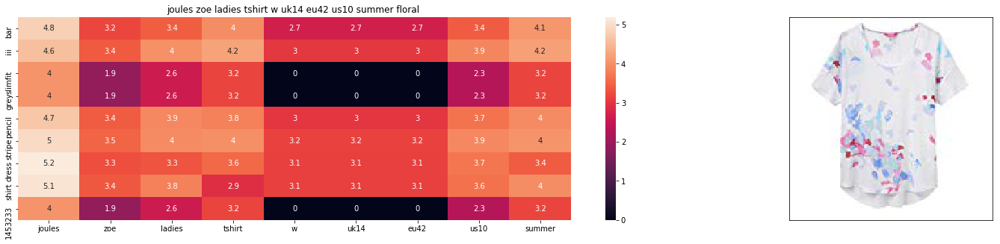

ASIN : B06XXJ2RQ4
Brand : Joules
euclidean distance from input : 13.465205637854849


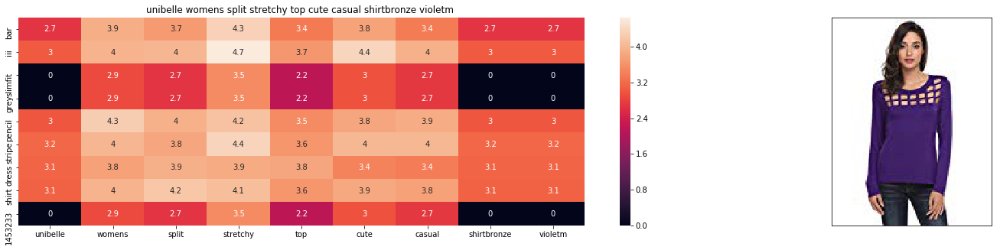

ASIN : B074PT5M59
Brand : Beautyuu
euclidean distance from input : 13.67446053846927


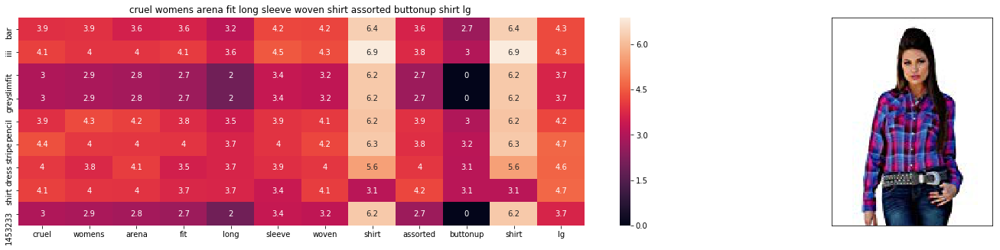

ASIN : B019OL33NG
Brand : Cruel
euclidean distance from input : 13.826095803819612


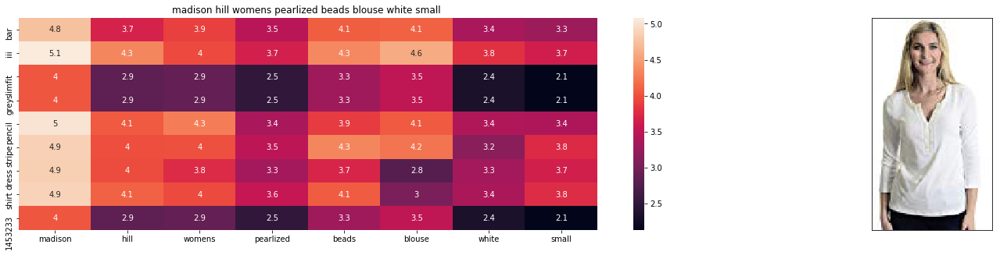

ASIN : B06XDL6V9W
Brand : madison & hill
euclidean distance from input : 13.838995393358186


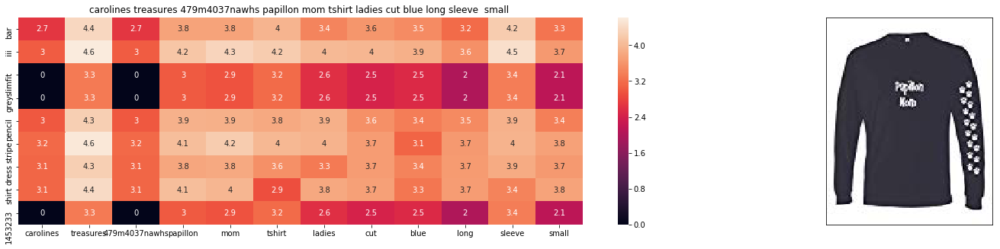

ASIN : B00J6ZNV3I
Brand : Caroline's Treasures
euclidean distance from input : 13.869020830723036


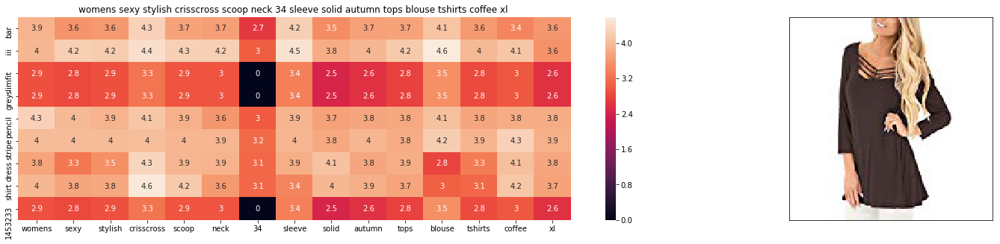

ASIN : B0755BYZW2
Brand : Jingying
euclidean distance from input : 13.934106104135788


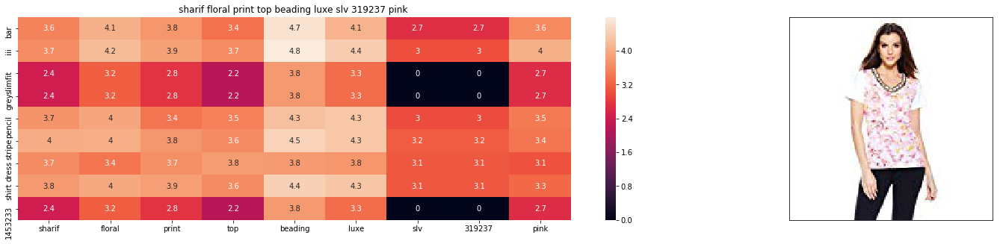

ASIN : B074LTBXR5
Brand : Sharif
euclidean distance from input : 13.956800119638718


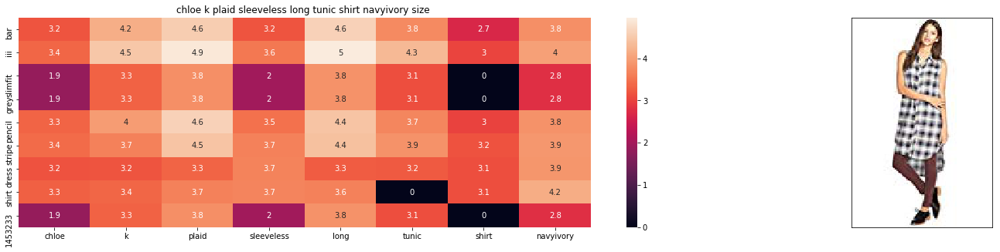

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 14.046261279029165


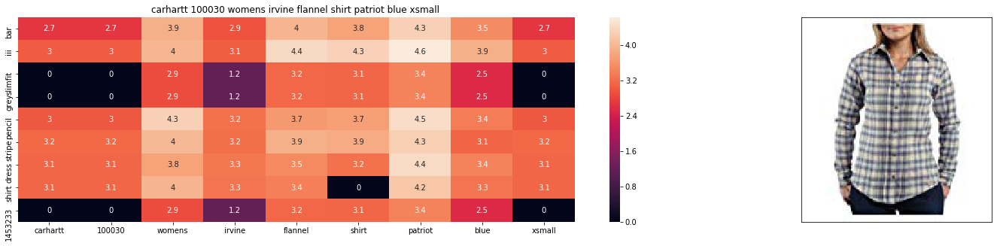

ASIN : B0088YO6BE
Brand : Carhartt
euclidean distance from input : 14.070146887064254


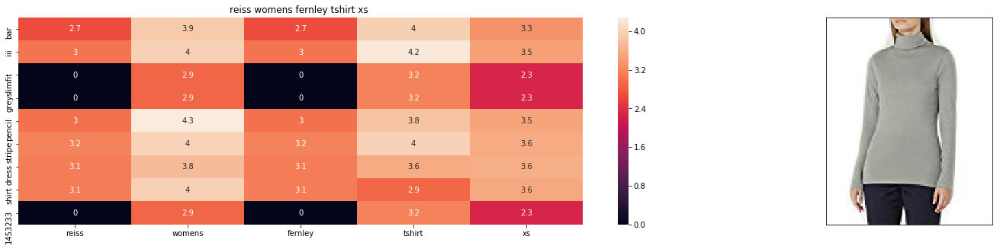

ASIN : B07577GBCJ
Brand : Reiss
euclidean distance from input : 14.07866195893315


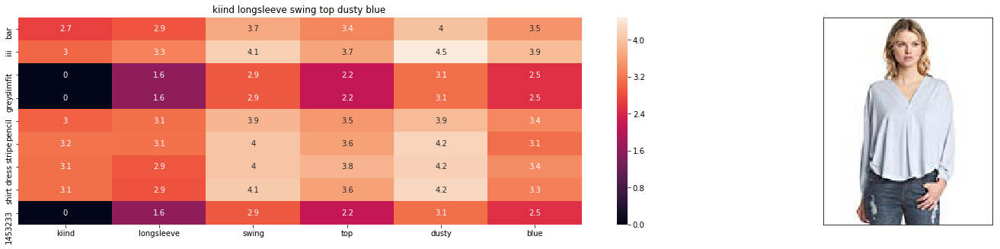

ASIN : B0142Q34LY
Brand : KIIND OF
euclidean distance from input : 14.081668854000684


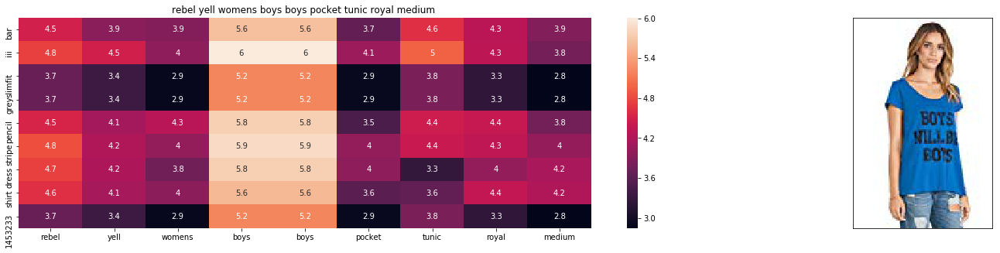

ASIN : B01CT4G42M
Brand : Rebel Yell
euclidean distance from input : 14.09279607161136


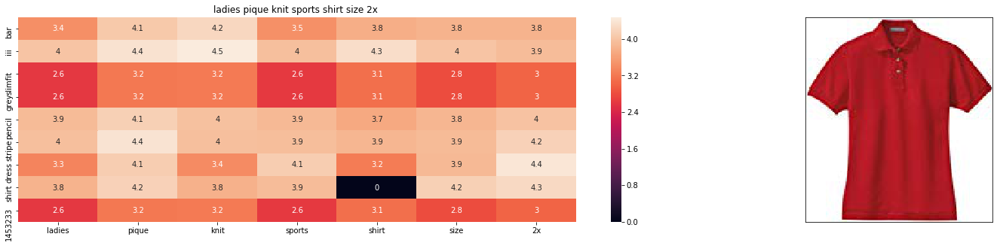

ASIN : B0028NOO4U
Brand : Bigmansland
euclidean distance from input : 14.117636680843946


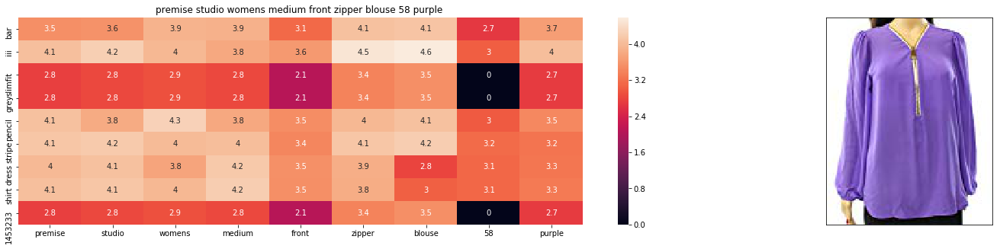

ASIN : B01M3YQ27P
Brand : Premise Studio
euclidean distance from input : 14.167317009213086


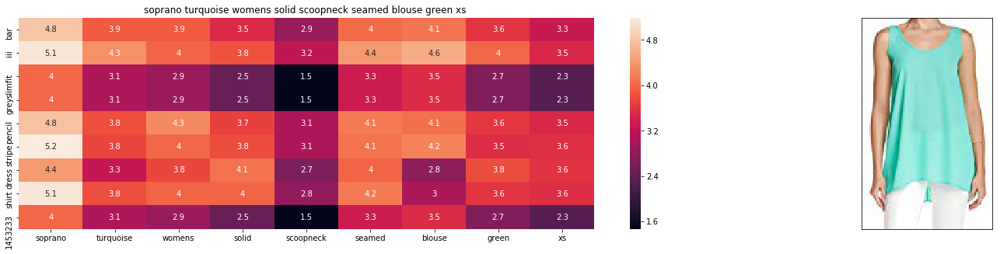

ASIN : B01JS7H6MA
Brand : Soprano
euclidean distance from input : 14.216275191863652


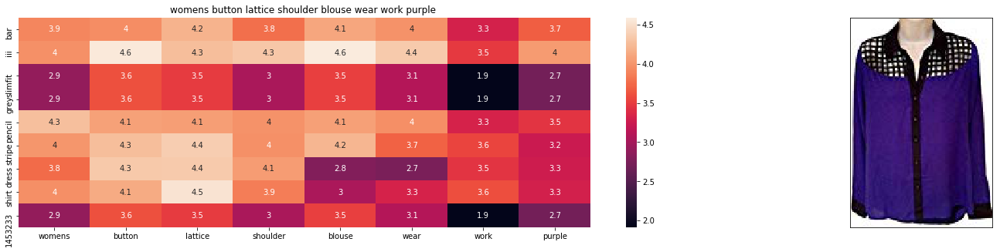

ASIN : B014G3SX1E
Brand : CHORD
euclidean distance from input : 14.288003985327995


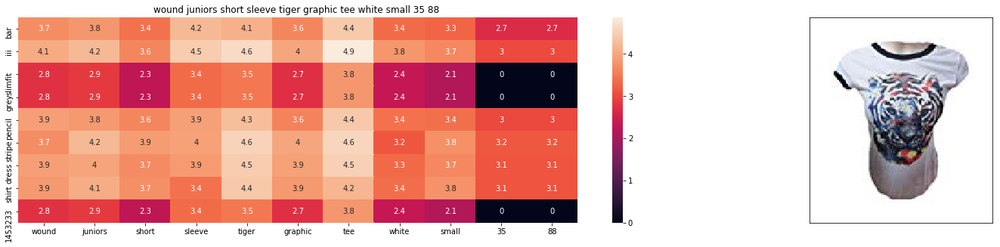

ASIN : B01F2UDRK2
Brand : Wound Up
euclidean distance from input : 14.289919090511914


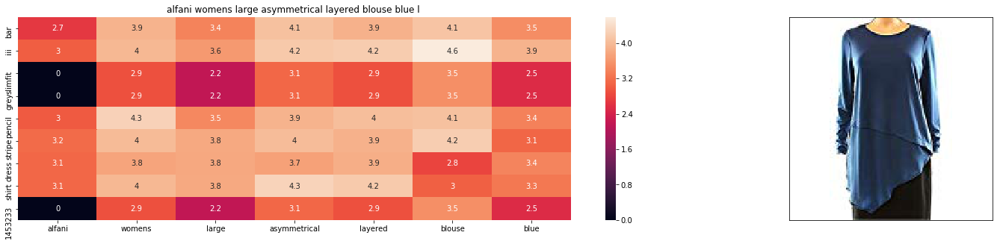

ASIN : B072N84K5G
Brand : Alfani
euclidean distance from input : 14.298843805551803


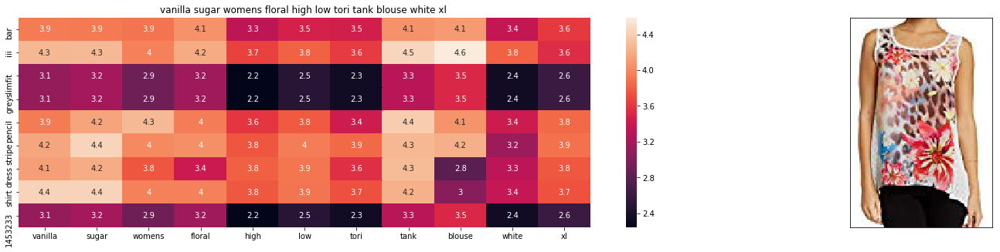

ASIN : B074WCPH8L
Brand : Vanilla Sugar
euclidean distance from input : 14.328150749447461


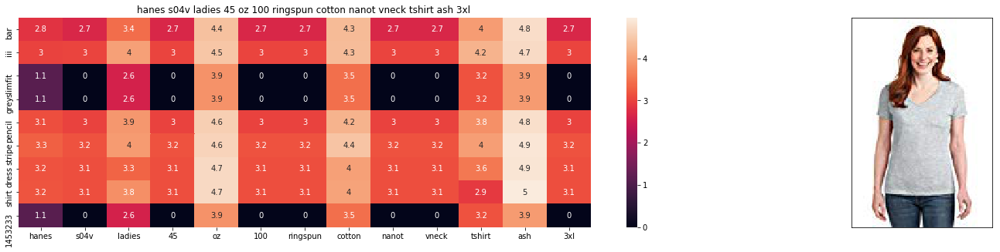

ASIN : B0159CM0X8
Brand : Hanes
euclidean distance from input : 14.333980083465576


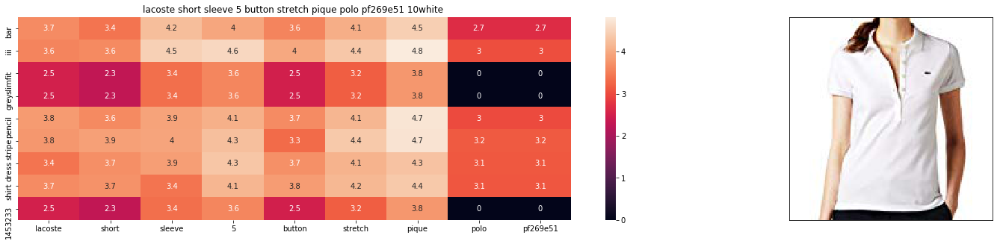

ASIN : B006WNYWT4
Brand : Lacoste
euclidean distance from input : 14.36021319286056


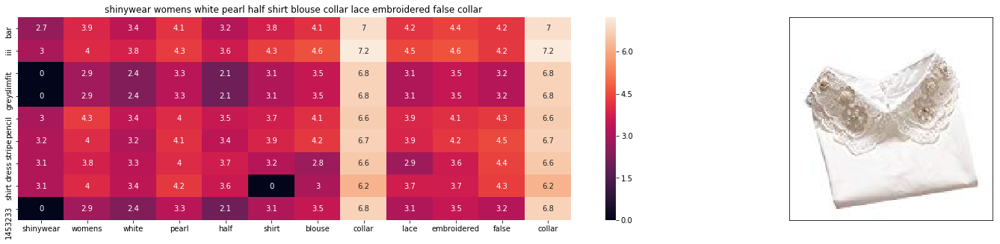

ASIN : B01LWYAF3R
Brand : Shinywear
euclidean distance from input : 14.371096015533086


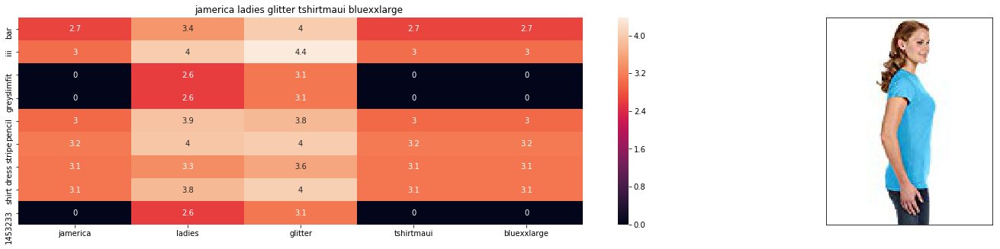

ASIN : B01DKIA3P0
Brand : J. America
euclidean distance from input : 14.380832004788036


In [134]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo
def idf_w2v_brand(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    #w3 : weight for image feature
    
   
    ##Here, image_dist is trying to find the pair-wise image distance between the products
    # w3 is the weight given to the image as a feature
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels withe the weights accordance
    image_dist =pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    print(image_dist.shape)
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist+ w3*image_dist)/float(w1 + w2+ w3)
    print(pairwise_dist.shape)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(937, 5, 5,5, 30)



(16042, 1)
(16042, 1)


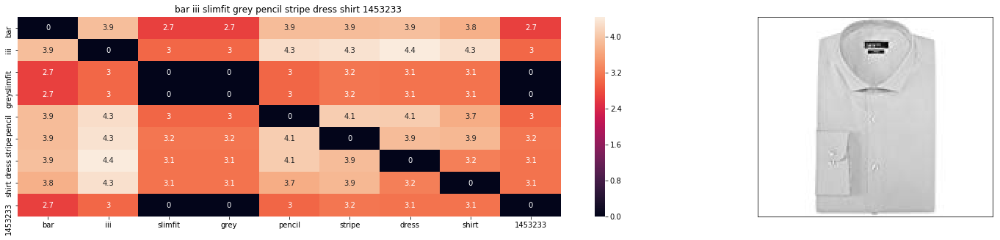

ASIN : B0153H0C7K
Brand : Bar III
euclidean distance from input : 0.00013810679316520692


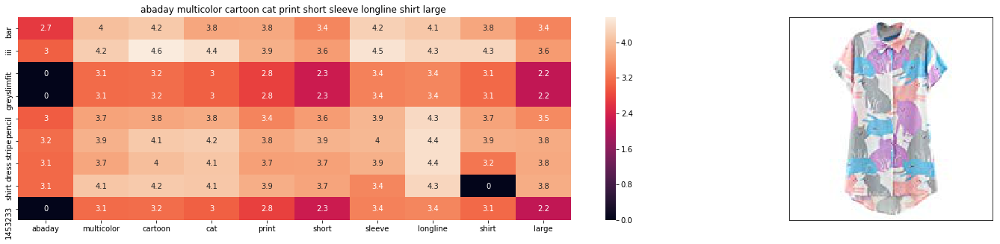

ASIN : B01CR57YY0
Brand : ABADAY
euclidean distance from input : 5.337928504943847


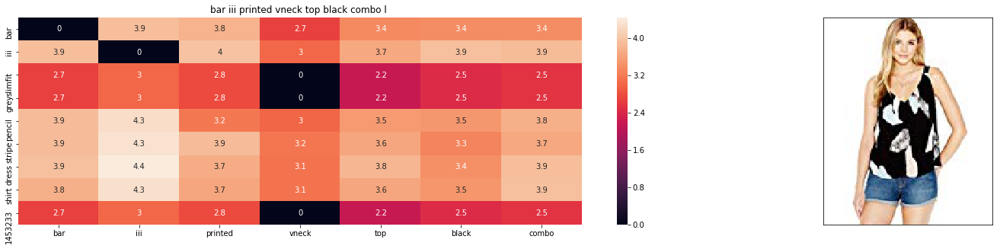

ASIN : B01KI9PNCM
Brand : Bar lll
euclidean distance from input : 7.011356176297348


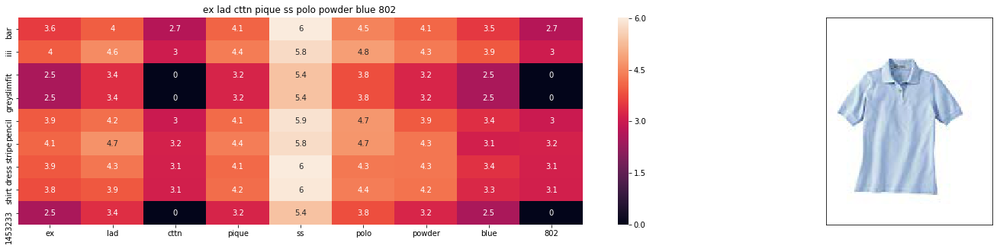

ASIN : B00ELC5OC2
Brand : Ash City
euclidean distance from input : 7.19731586499664


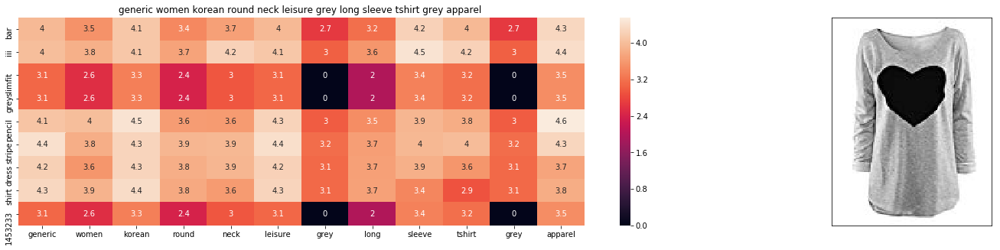

ASIN : B013LL0ENM
Brand : Absolutely
euclidean distance from input : 8.37012137350549


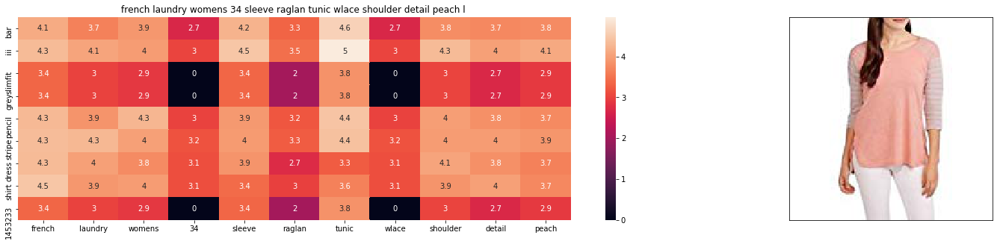

ASIN : B06Y5SZF7B
Brand : French Laundry
euclidean distance from input : 9.20304578824493


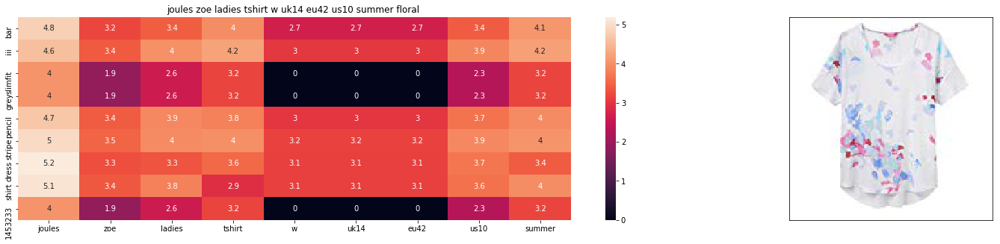

ASIN : B06XXJ2RQ4
Brand : Joules
euclidean distance from input : 9.210494232611387


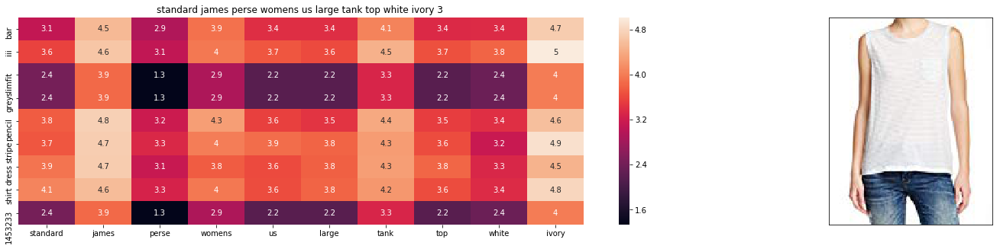

ASIN : B074SV25HV
Brand : Standard James Perse
euclidean distance from input : 9.29042956912349


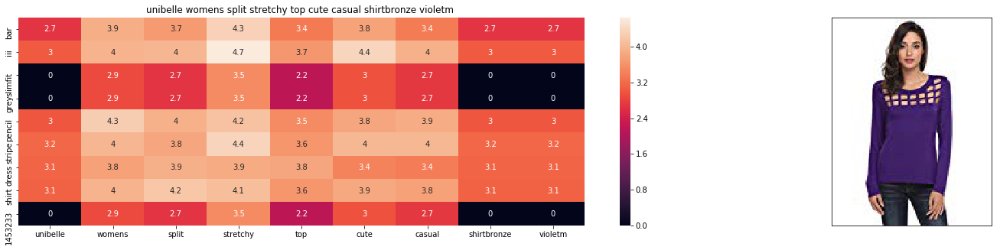

ASIN : B074PT5M59
Brand : Beautyuu
euclidean distance from input : 9.336047172980038


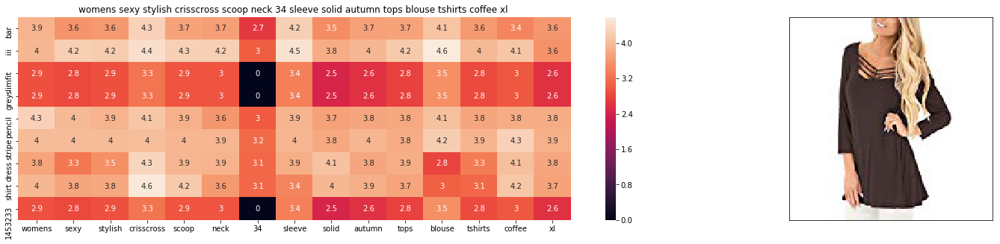

ASIN : B0755BYZW2
Brand : Jingying
euclidean distance from input : 9.418764186907309


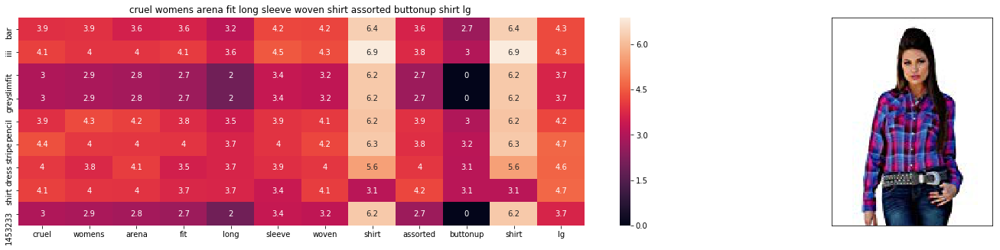

ASIN : B019OL33NG
Brand : Cruel
euclidean distance from input : 9.427028332190243


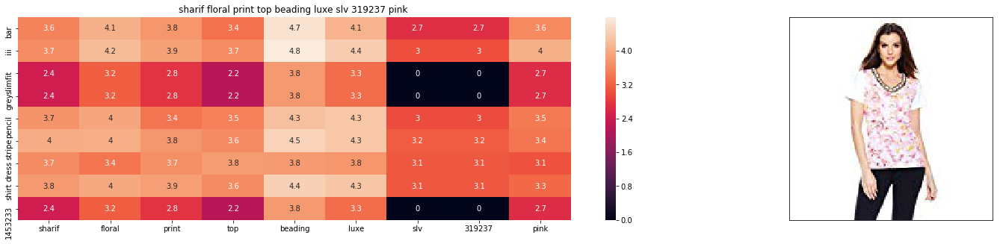

ASIN : B074LTBXR5
Brand : Sharif
euclidean distance from input : 9.432380596209066


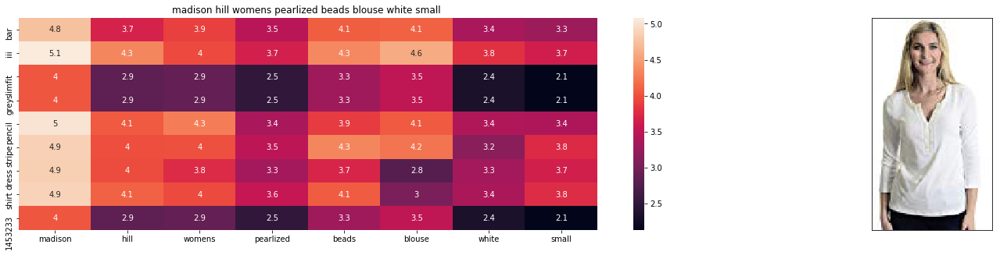

ASIN : B06XDL6V9W
Brand : madison & hill
euclidean distance from input : 9.434768085913388


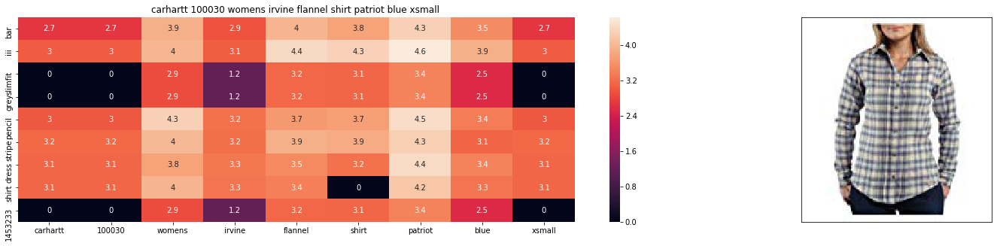

ASIN : B0088YO6BE
Brand : Carhartt
euclidean distance from input : 9.50038865666439


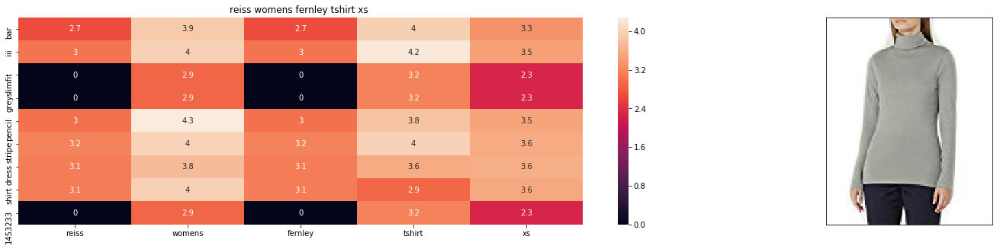

ASIN : B07577GBCJ
Brand : Reiss
euclidean distance from input : 9.505497699785728


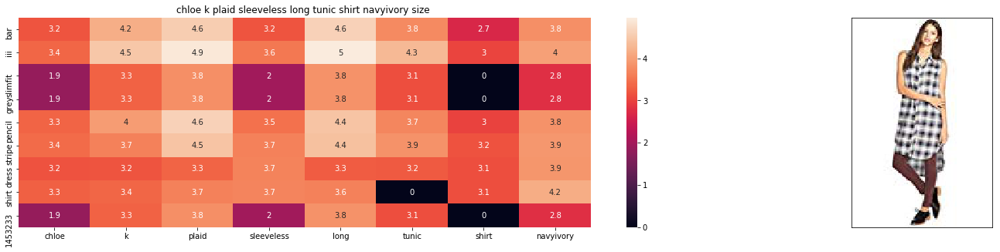

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 9.559127617315976


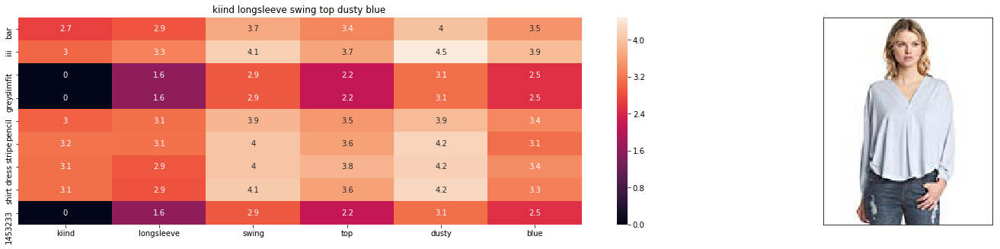

ASIN : B0142Q34LY
Brand : KIIND OF
euclidean distance from input : 9.580372162298886


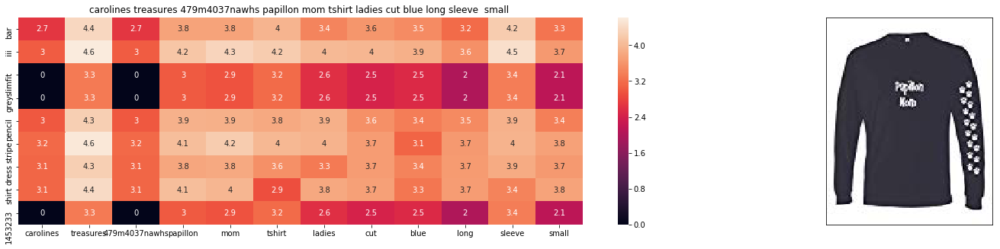

ASIN : B00J6ZNV3I
Brand : Caroline's Treasures
euclidean distance from input : 9.586323562501175


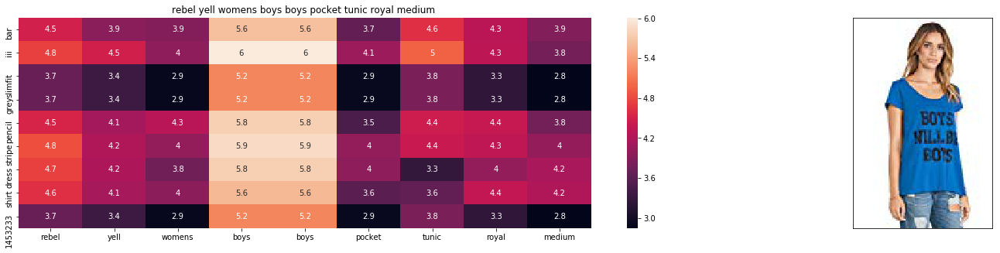

ASIN : B01CT4G42M
Brand : Rebel Yell
euclidean distance from input : 9.587048492865293


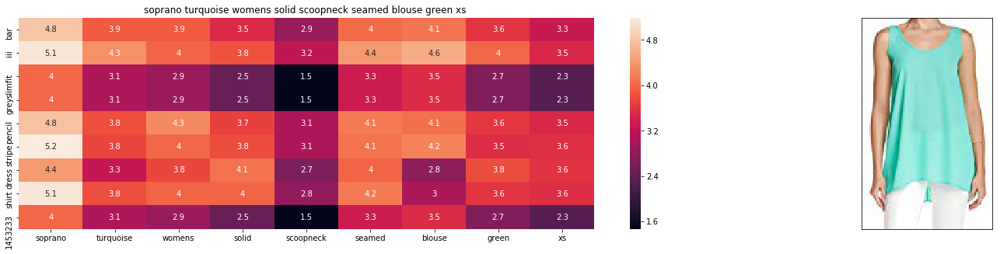

ASIN : B01JS7H6MA
Brand : Soprano
euclidean distance from input : 9.588065639544029


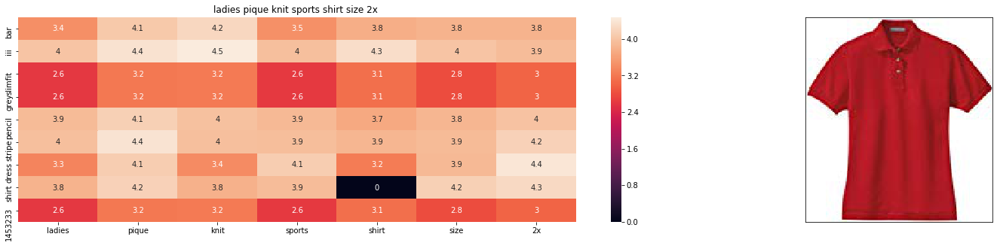

ASIN : B0028NOO4U
Brand : Bigmansland
euclidean distance from input : 9.601952858404843


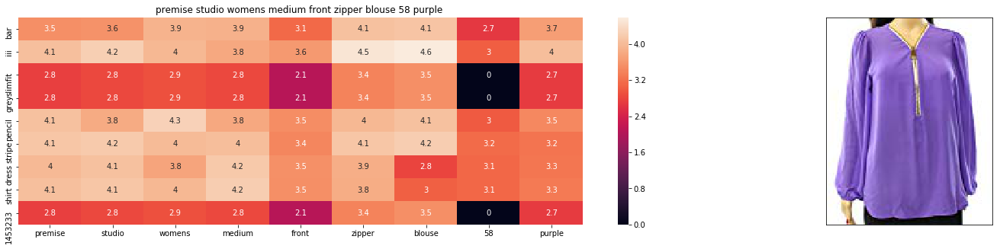

ASIN : B01M3YQ27P
Brand : Premise Studio
euclidean distance from input : 9.631761055426328


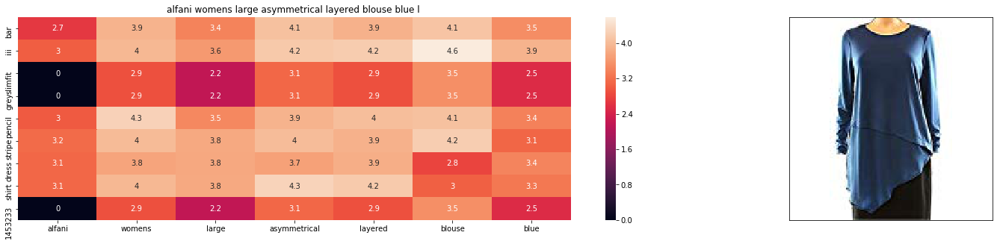

ASIN : B072N84K5G
Brand : Alfani
euclidean distance from input : 9.637606807756919


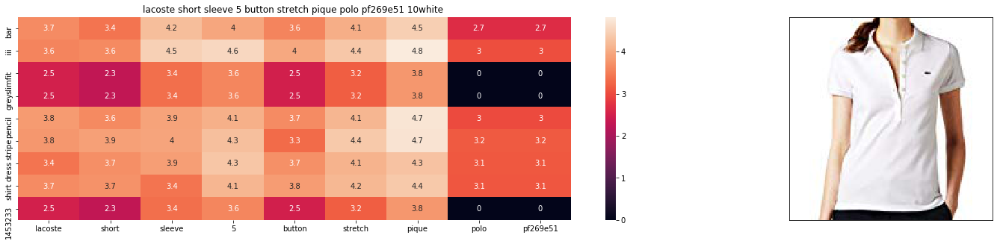

ASIN : B006WNYWT4
Brand : Lacoste
euclidean distance from input : 9.674428440142172


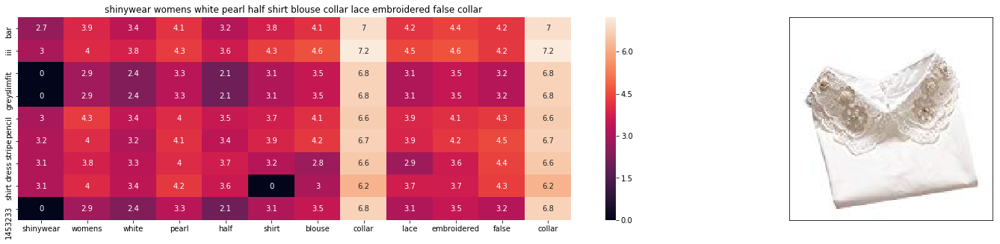

ASIN : B01LWYAF3R
Brand : Shinywear
euclidean distance from input : 9.680958133745689


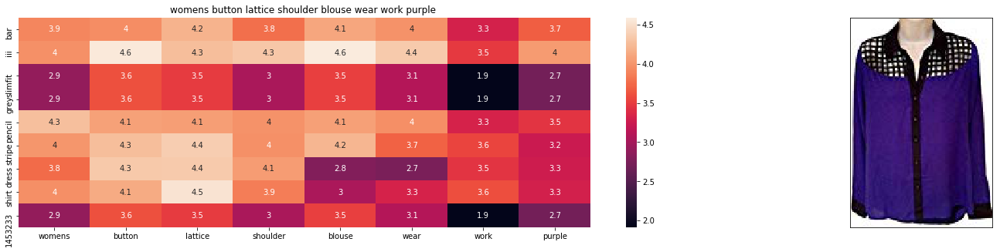

ASIN : B014G3SX1E
Brand : CHORD
euclidean distance from input : 9.704173241095273


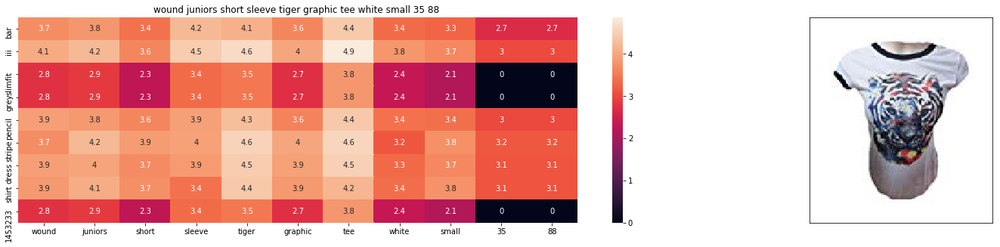

ASIN : B01F2UDRK2
Brand : Wound Up
euclidean distance from input : 9.705322304205625


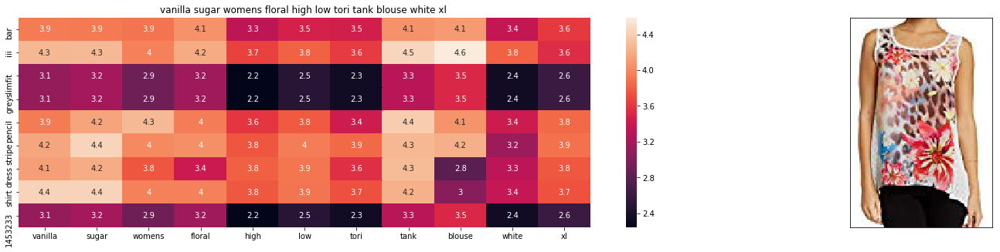

ASIN : B074WCPH8L
Brand : Vanilla Sugar
euclidean distance from input : 9.728261299566952


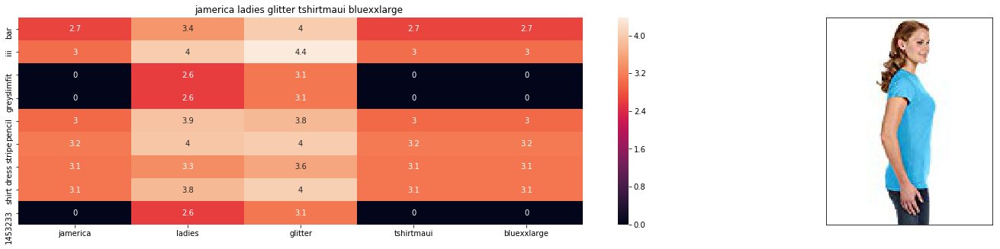

ASIN : B01DKIA3P0
Brand : J. America
euclidean distance from input : 9.759870052771298


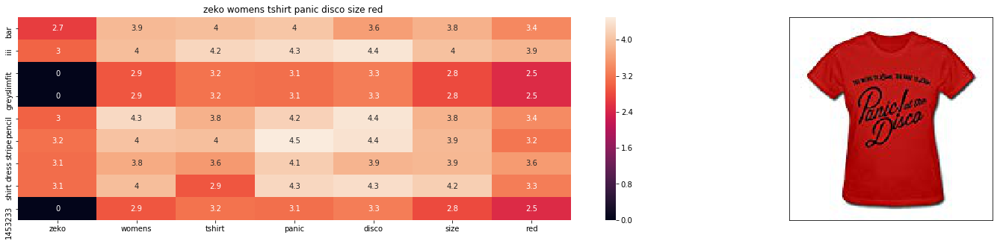

ASIN : B018G1J5NC
Brand : ZEKO
euclidean distance from input : 9.767574249315757


In [135]:

idf_w2v_brand(937, 5, 15,5, 30)



(16042, 1)
(16042, 1)


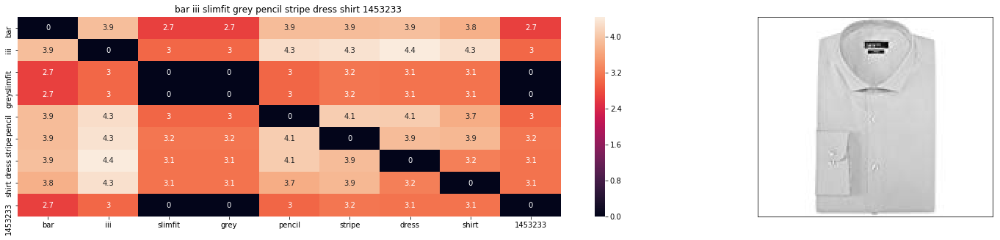

ASIN : B0153H0C7K
Brand : Bar III
euclidean distance from input : 0.00013810679316520692


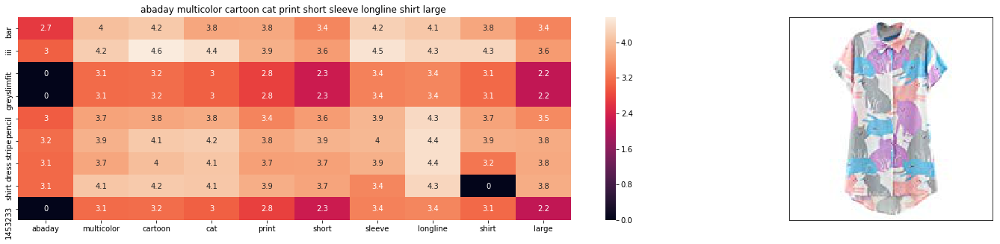

ASIN : B01CR57YY0
Brand : ABADAY
euclidean distance from input : 10.792930946350097


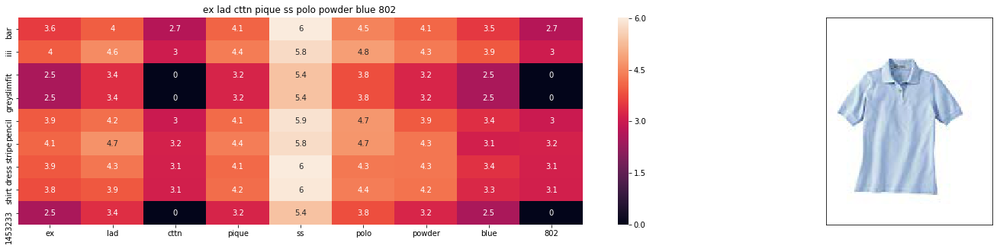

ASIN : B00ELC5OC2
Brand : Ash City
euclidean distance from input : 16.55538959517629


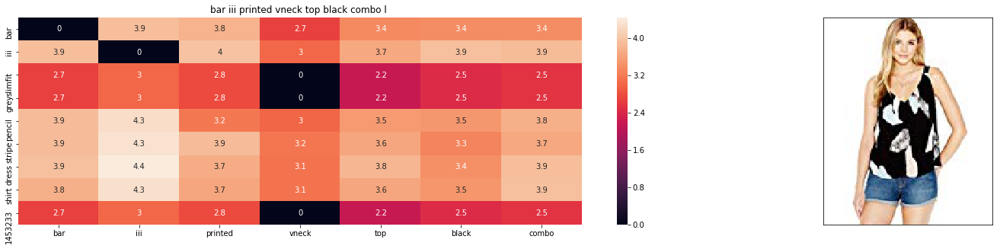

ASIN : B01KI9PNCM
Brand : Bar lll
euclidean distance from input : 16.77176596766064


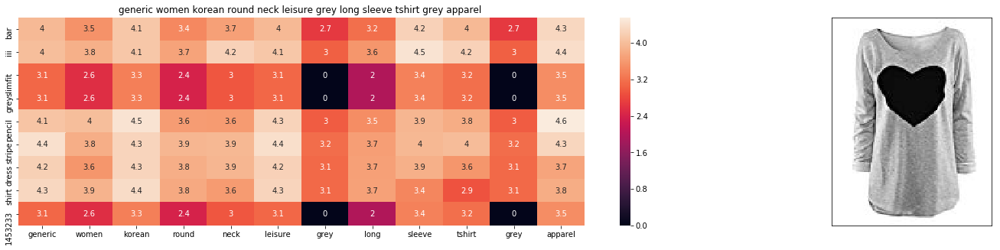

ASIN : B013LL0ENM
Brand : Absolutely
euclidean distance from input : 21.126295989146197


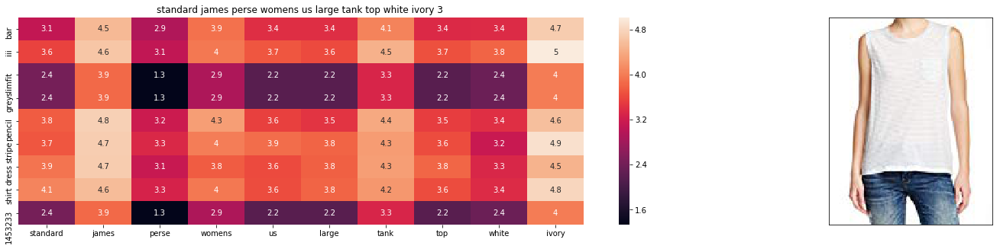

ASIN : B074SV25HV
Brand : Standard James Perse
euclidean distance from input : 22.35741791911864


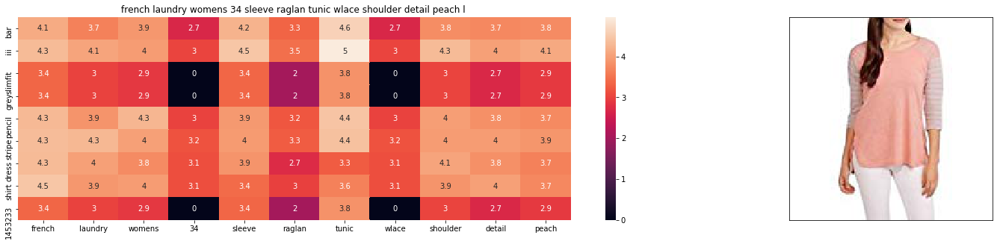

ASIN : B06Y5SZF7B
Brand : French Laundry
euclidean distance from input : 22.711972789908955


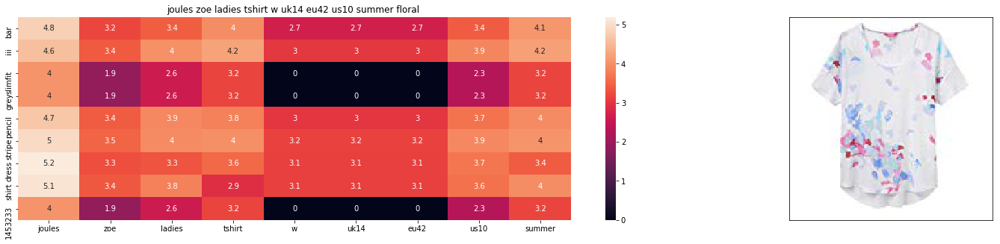

ASIN : B06XXJ2RQ4
Brand : Joules
euclidean distance from input : 22.71942123427541


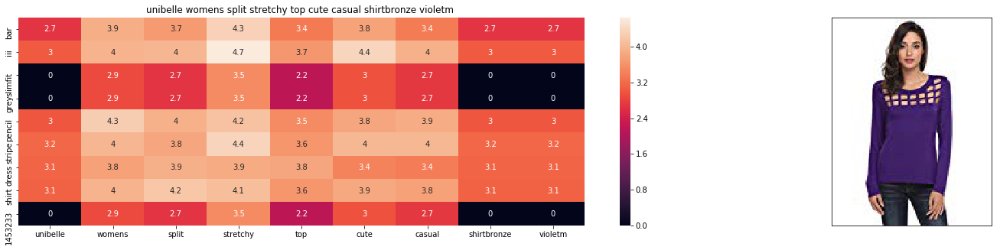

ASIN : B074PT5M59
Brand : Beautyuu
euclidean distance from input : 23.025309868003436


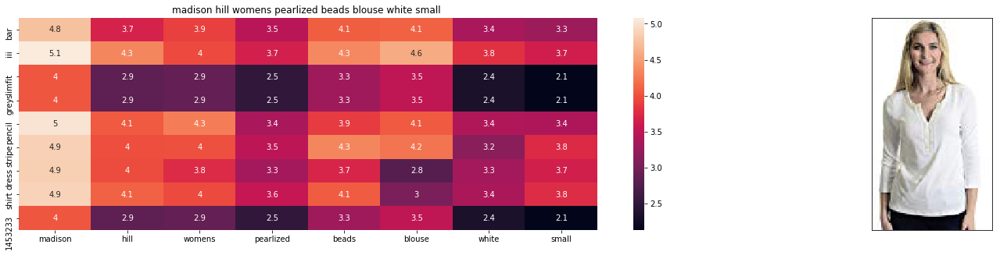

ASIN : B06XDL6V9W
Brand : madison & hill
euclidean distance from input : 23.264272480155537


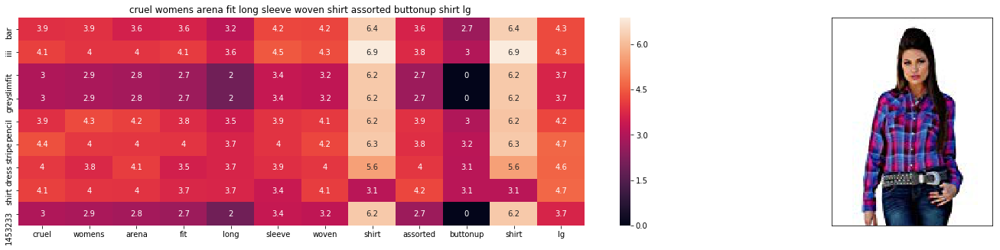

ASIN : B019OL33NG
Brand : Cruel
euclidean distance from input : 23.306829357291768


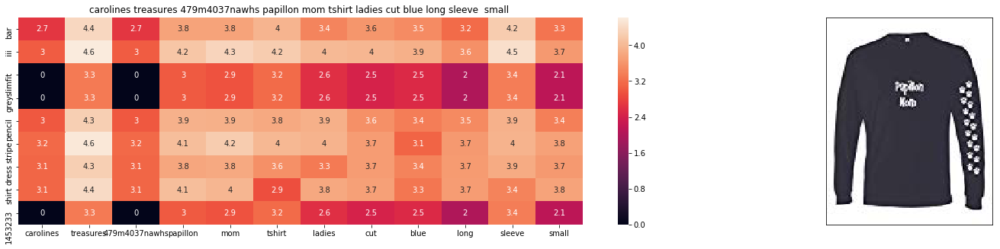

ASIN : B00J6ZNV3I
Brand : Caroline's Treasures
euclidean distance from input : 23.31281508632445


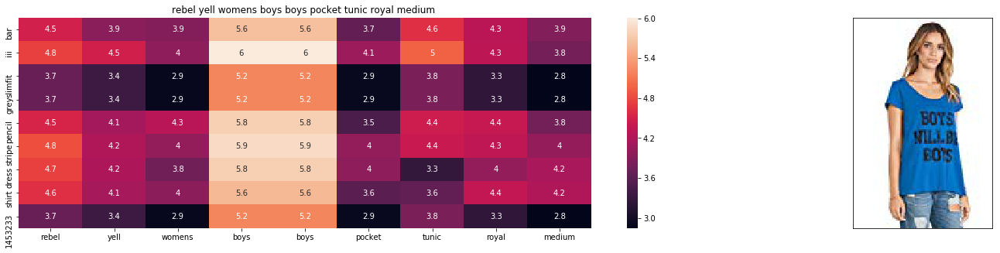

ASIN : B01CT4G42M
Brand : Rebel Yell
euclidean distance from input : 23.558177642966815


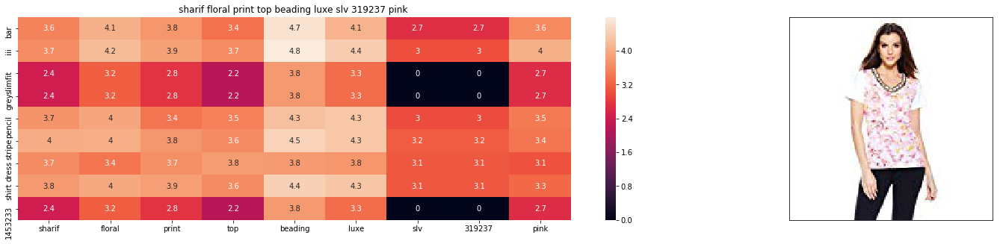

ASIN : B074LTBXR5
Brand : Sharif
euclidean distance from input : 23.600582146978546


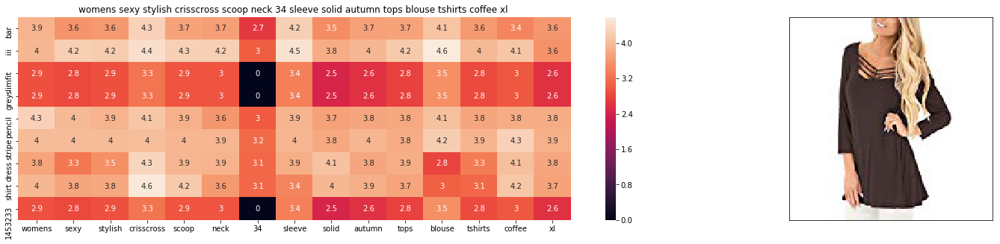

ASIN : B0755BYZW2
Brand : Jingying
euclidean distance from input : 23.61522806677835


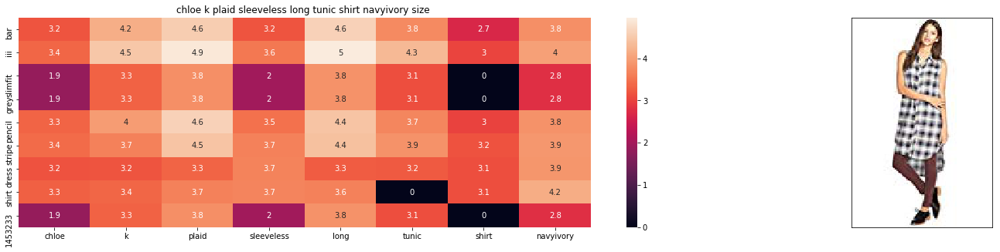

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 23.741501884605


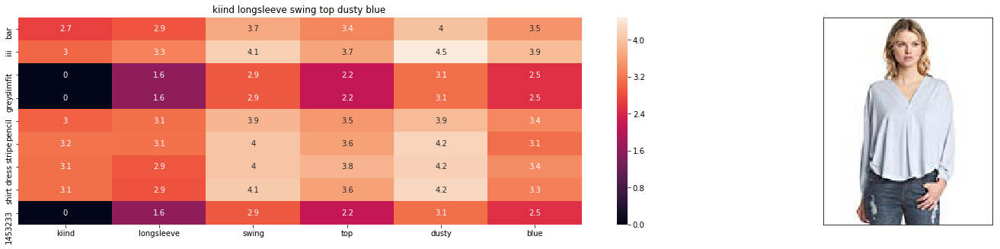

ASIN : B0142Q34LY
Brand : KIIND OF
euclidean distance from input : 23.75749557509572


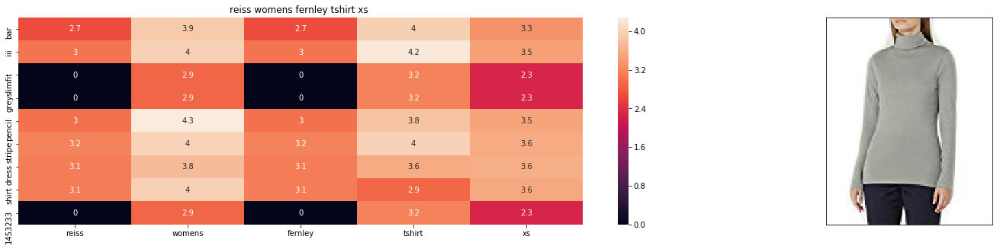

ASIN : B07577GBCJ
Brand : Reiss
euclidean distance from input : 23.80679861578958


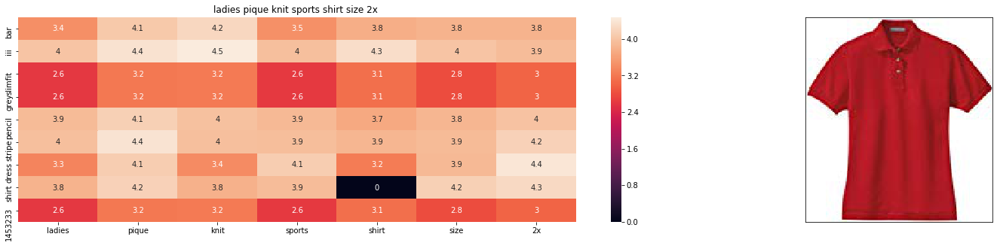

ASIN : B0028NOO4U
Brand : Bigmansland
euclidean distance from input : 23.81368259444387


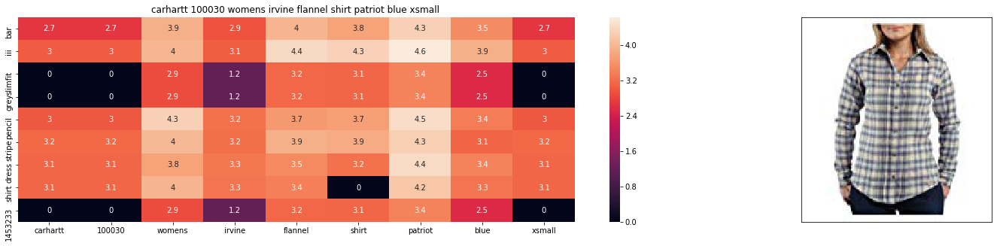

ASIN : B0088YO6BE
Brand : Carhartt
euclidean distance from input : 23.915491452551056


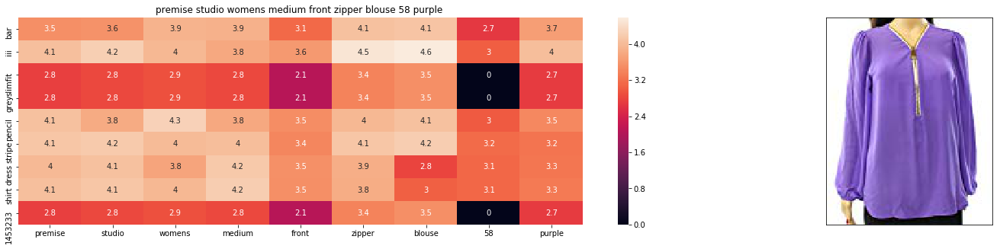

ASIN : B01M3YQ27P
Brand : Premise Studio
euclidean distance from input : 23.986287422324725


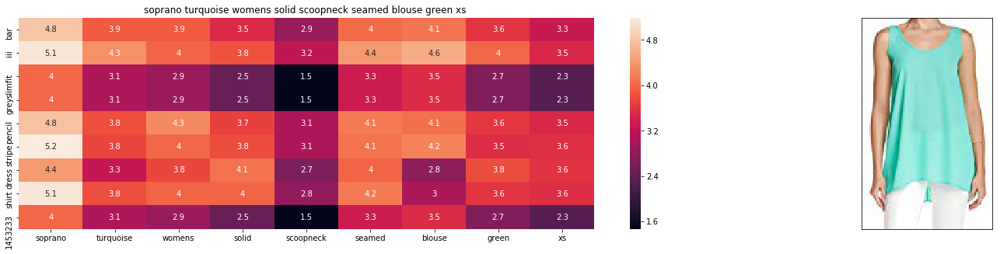

ASIN : B01JS7H6MA
Brand : Soprano
euclidean distance from input : 24.03404917273538


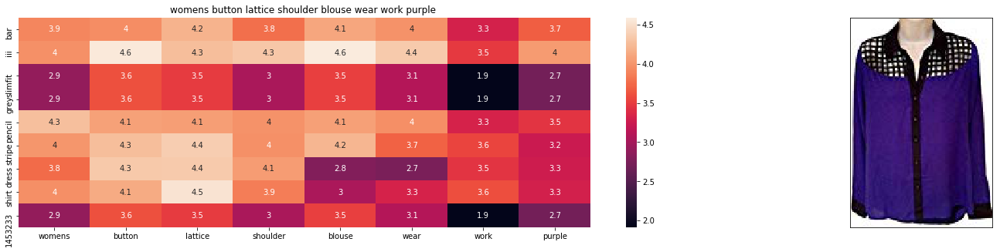

ASIN : B014G3SX1E
Brand : CHORD
euclidean distance from input : 24.126206932212423


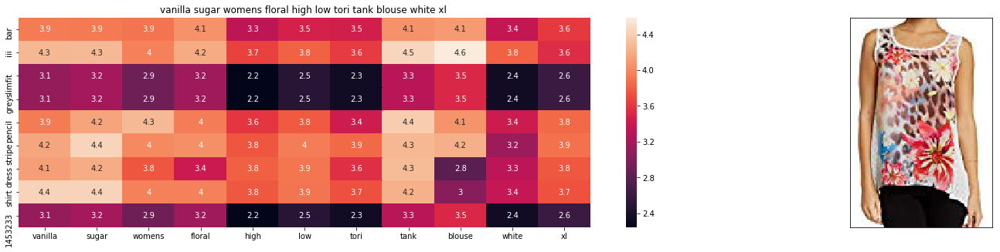

ASIN : B074WCPH8L
Brand : Vanilla Sugar
euclidean distance from input : 24.17493122115285


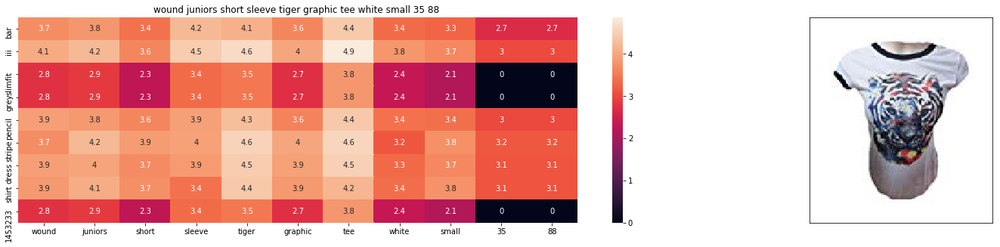

ASIN : B01F2UDRK2
Brand : Wound Up
euclidean distance from input : 24.17771976485402


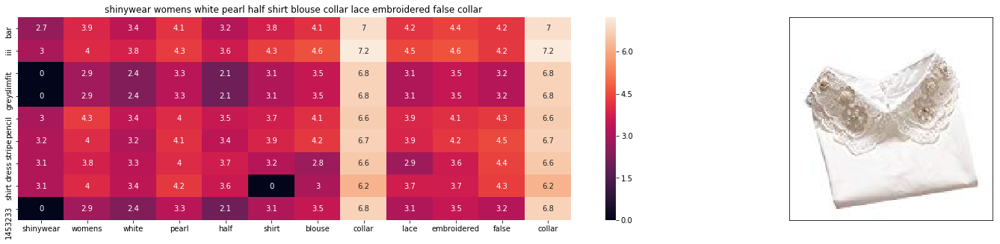

ASIN : B01LWYAF3R
Brand : Shinywear
euclidean distance from input : 24.20054213080423


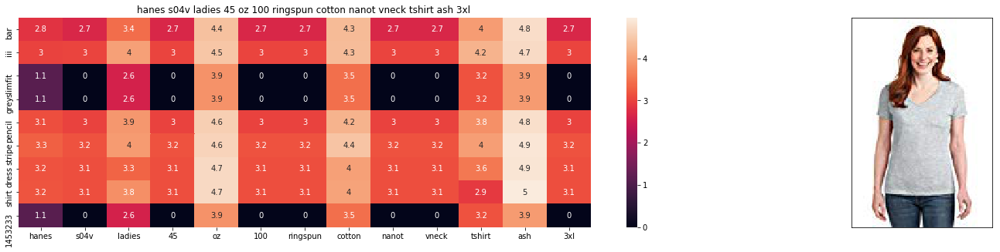

ASIN : B0159CM0X8
Brand : Hanes
euclidean distance from input : 24.206901721954345


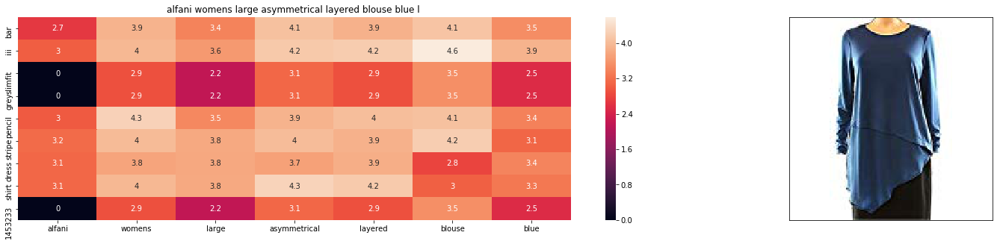

ASIN : B072N84K5G
Brand : Alfani
euclidean distance from input : 24.235021005010772


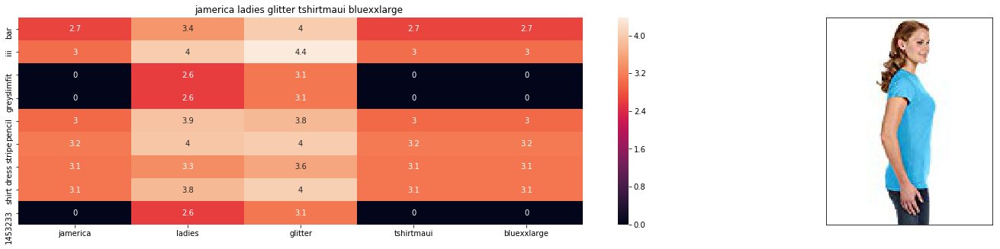

ASIN : B01DKIA3P0
Brand : J. America
euclidean distance from input : 24.300126400138446


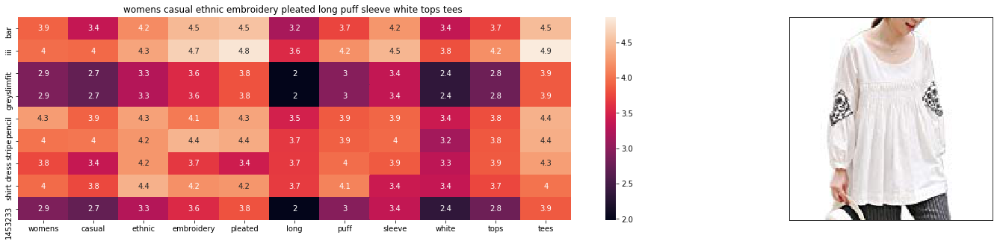

ASIN : B074LQB4TQ
Brand : FEIANNA
euclidean distance from input : 24.30937837600708


In [136]:
idf_w2v_brand(937, 5, 5,15, 30)

(16042, 1)
(16042, 1)


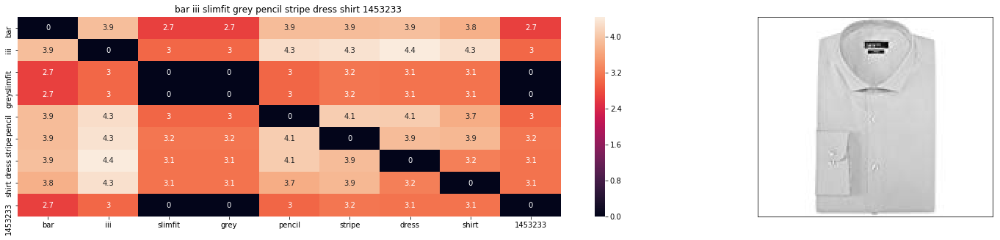

ASIN : B0153H0C7K
Brand : Bar III
euclidean distance from input : 0.00023017798860867819


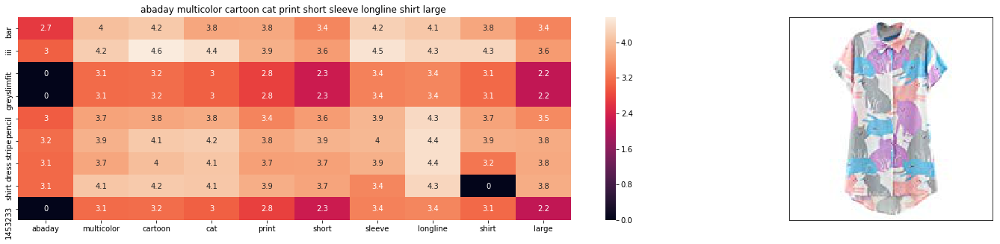

ASIN : B01CR57YY0
Brand : ABADAY
euclidean distance from input : 4.623629824320475


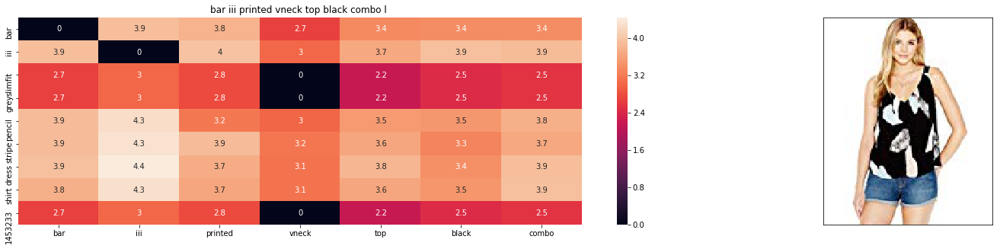

ASIN : B01KI9PNCM
Brand : Bar lll
euclidean distance from input : 5.985762797925606


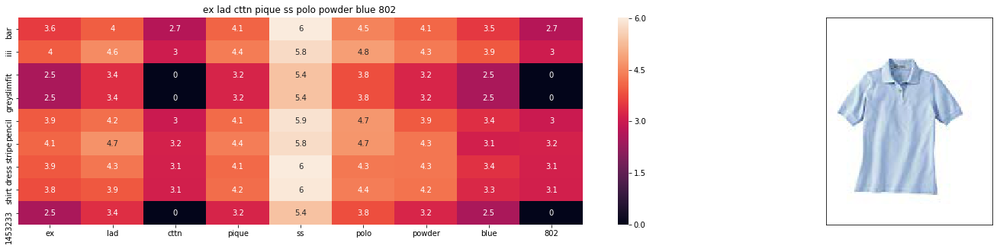

ASIN : B00ELC5OC2
Brand : Ash City
euclidean distance from input : 6.210711479548388


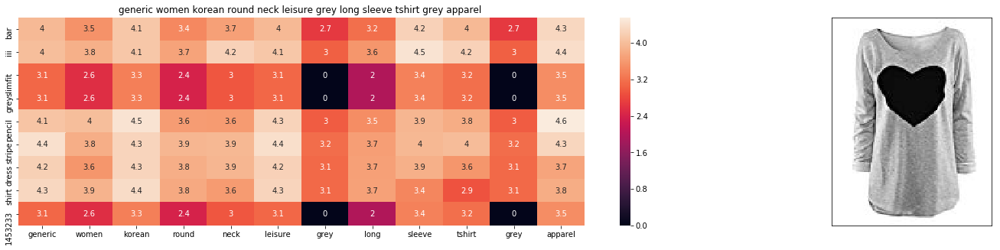

ASIN : B013LL0ENM
Brand : Absolutely
euclidean distance from input : 7.1444180562852955


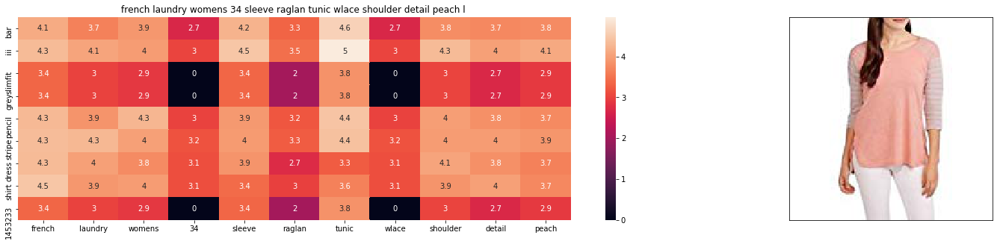

ASIN : B06Y5SZF7B
Brand : French Laundry
euclidean distance from input : 7.824071979884081


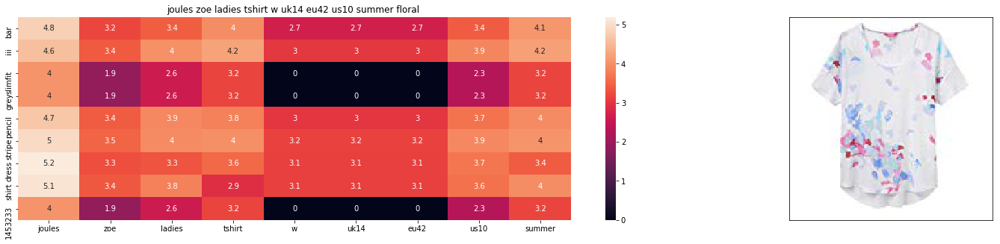

ASIN : B06XXJ2RQ4
Brand : Joules
euclidean distance from input : 7.836486053828173


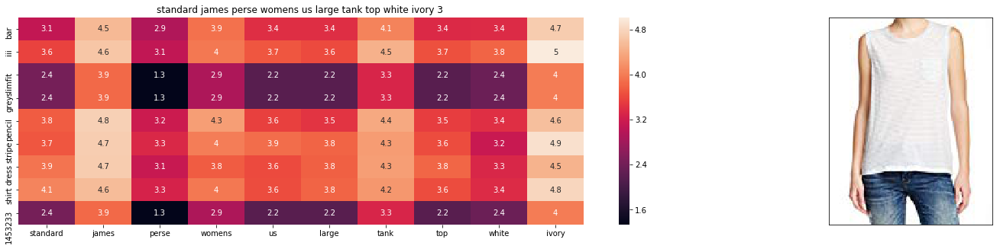

ASIN : B074SV25HV
Brand : Standard James Perse
euclidean distance from input : 7.931285695928917


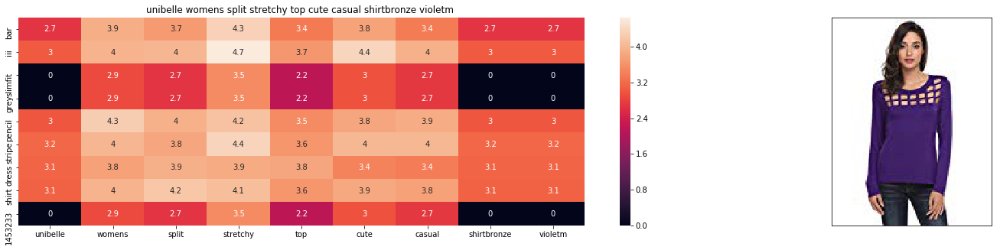

ASIN : B074PT5M59
Brand : Beautyuu
euclidean distance from input : 7.970601590835823


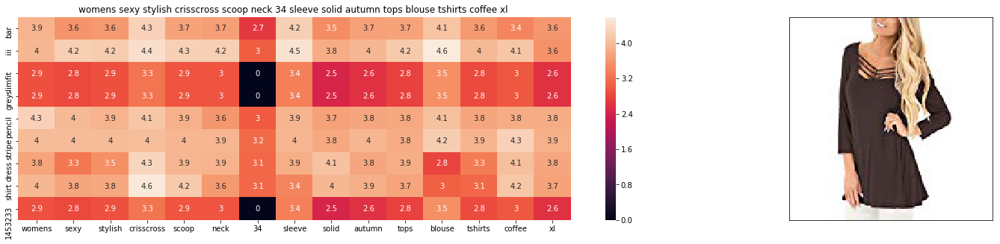

ASIN : B0755BYZW2
Brand : Jingying
euclidean distance from input : 8.01891332948249


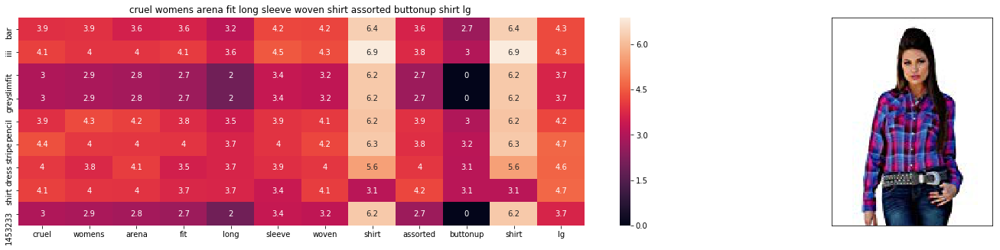

ASIN : B019OL33NG
Brand : Cruel
euclidean distance from input : 8.042845376693977


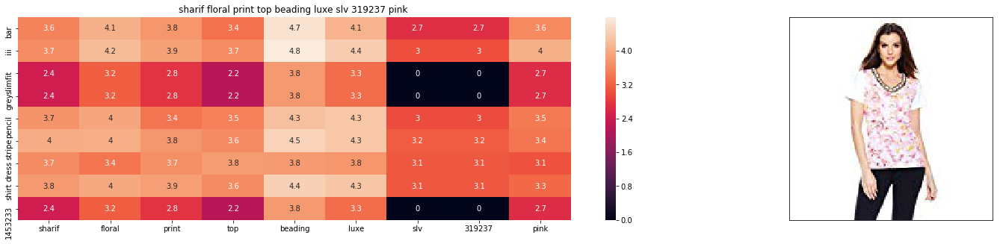

ASIN : B074LTBXR5
Brand : Sharif
euclidean distance from input : 8.053382552504951


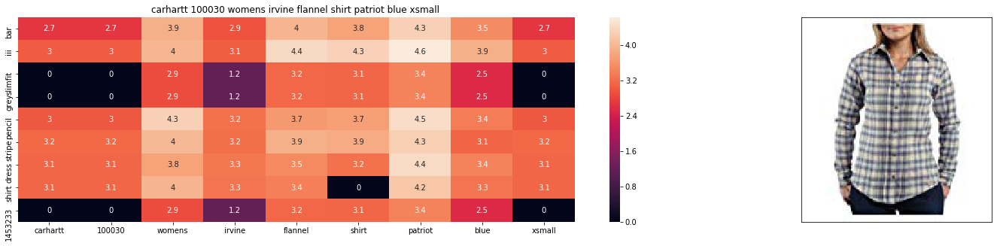

ASIN : B0088YO6BE
Brand : Carhartt
euclidean distance from input : 8.063854055444812


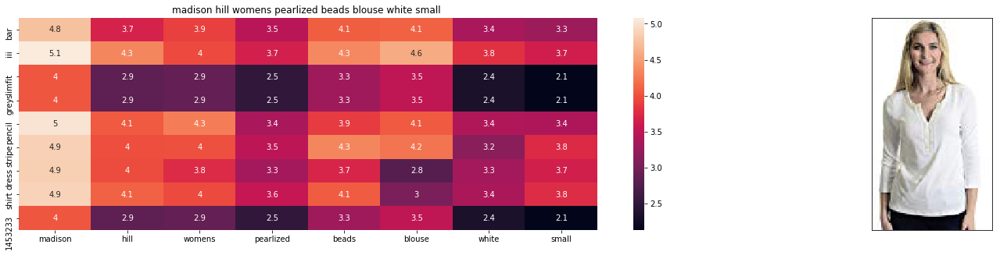

ASIN : B06XDL6V9W
Brand : madison & hill
euclidean distance from input : 8.076701387130989


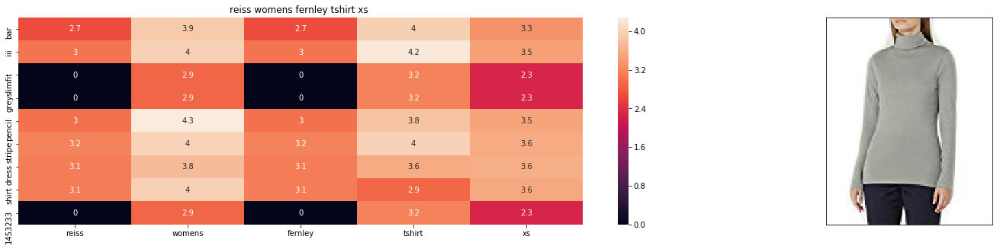

ASIN : B07577GBCJ
Brand : Reiss
euclidean distance from input : 8.11978683157803


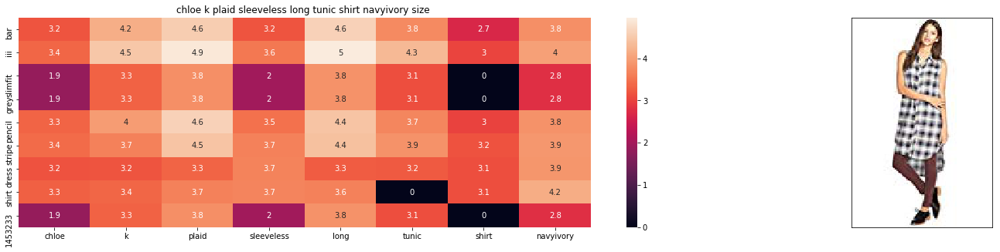

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 8.13693866765874


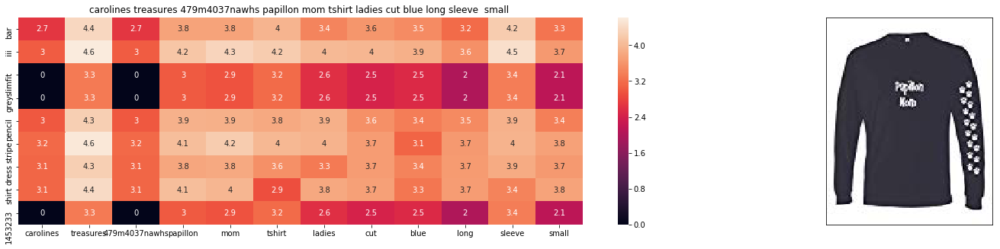

ASIN : B00J6ZNV3I
Brand : Caroline's Treasures
euclidean distance from input : 8.14964885383704


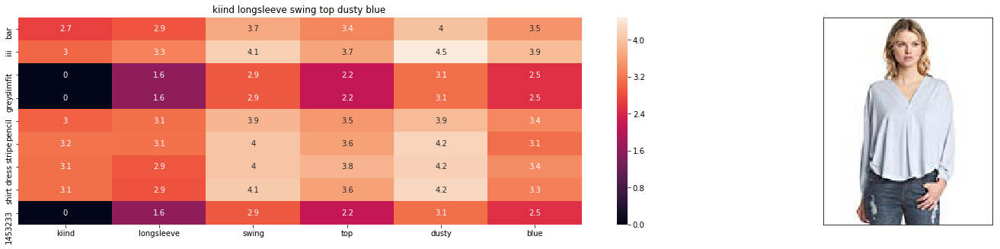

ASIN : B0142Q34LY
Brand : KIIND OF
euclidean distance from input : 8.174533844355517


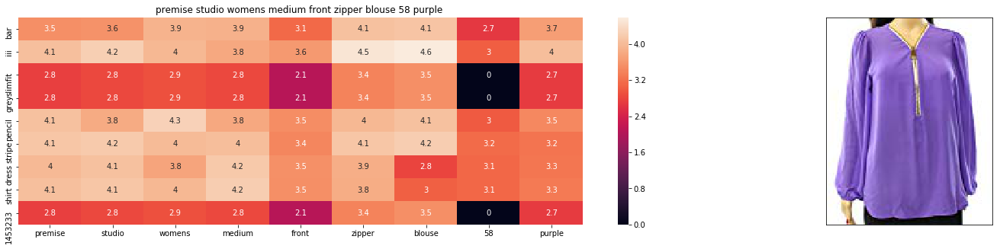

ASIN : B01M3YQ27P
Brand : Premise Studio
euclidean distance from input : 8.186264864965056


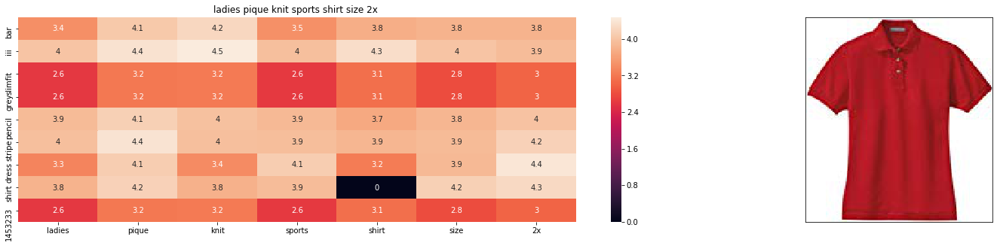

ASIN : B0028NOO4U
Brand : Bigmansland
euclidean distance from input : 8.196082624161019


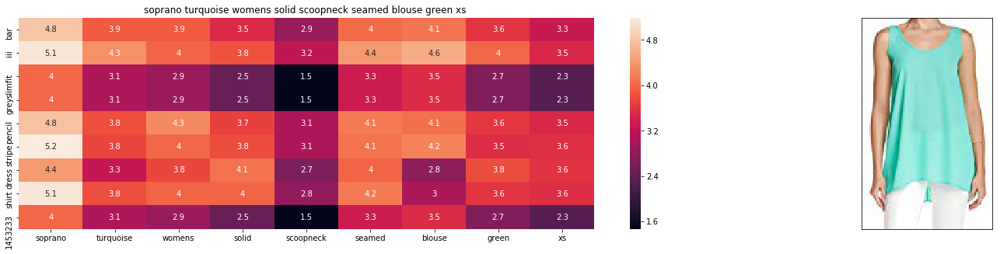

ASIN : B01JS7H6MA
Brand : Soprano
euclidean distance from input : 8.197115640680407


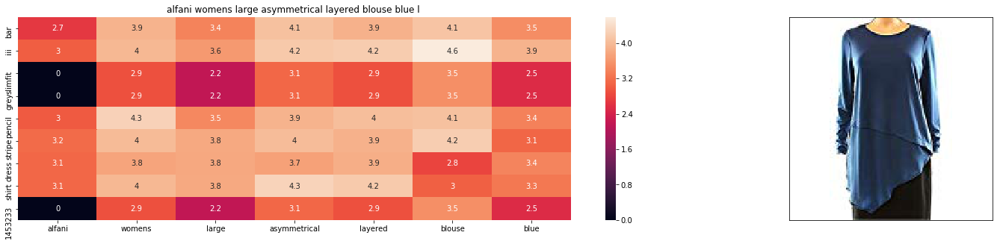

ASIN : B072N84K5G
Brand : Alfani
euclidean distance from input : 8.216588144342516


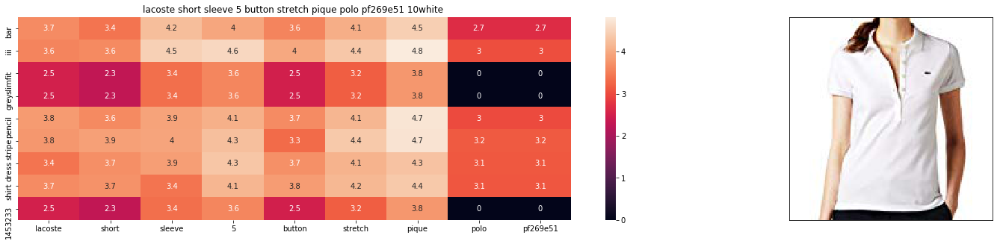

ASIN : B006WNYWT4
Brand : Lacoste
euclidean distance from input : 8.226445385655179


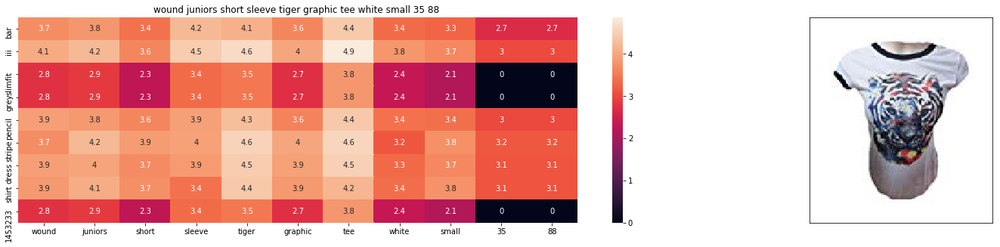

ASIN : B01F2UDRK2
Brand : Wound Up
euclidean distance from input : 8.259753990534715


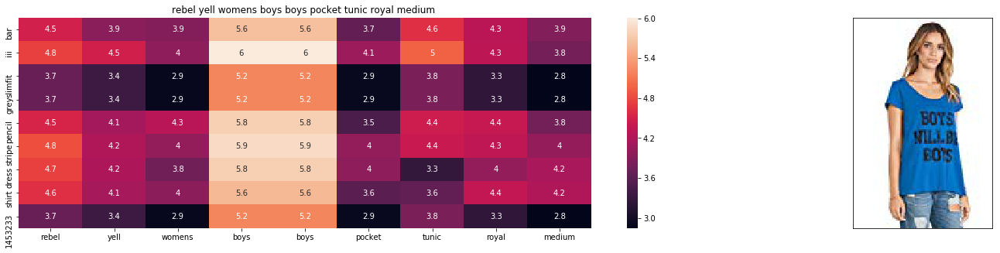

ASIN : B01CT4G42M
Brand : Rebel Yell
euclidean distance from input : 8.271492259069058


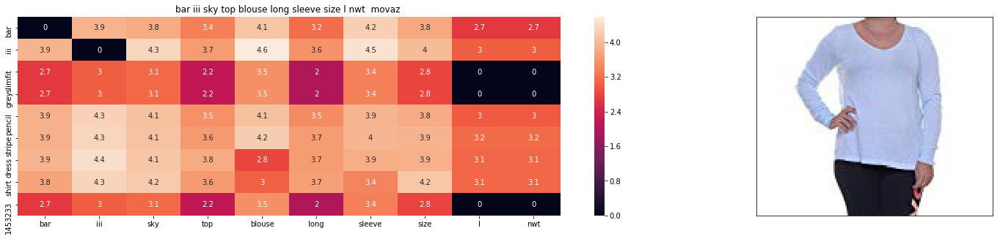

ASIN : B0748LNFLJ
Brand : Bar lll
euclidean distance from input : 8.275675848259265


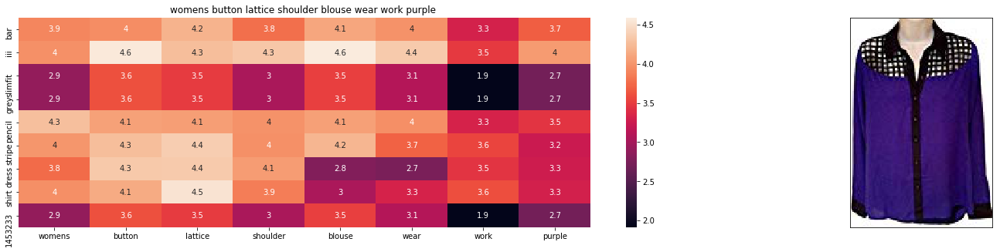

ASIN : B014G3SX1E
Brand : CHORD
euclidean distance from input : 8.278822772069548


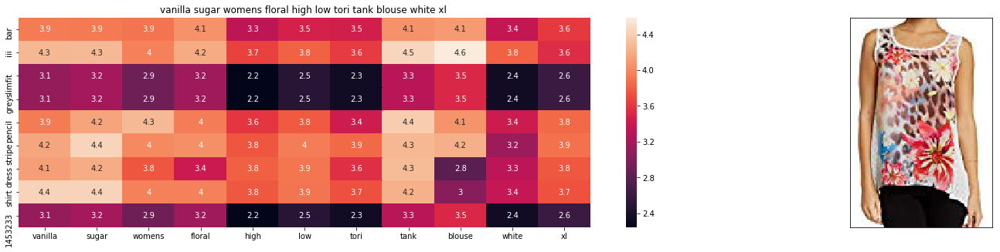

ASIN : B074WCPH8L
Brand : Vanilla Sugar
euclidean distance from input : 8.308705457412971


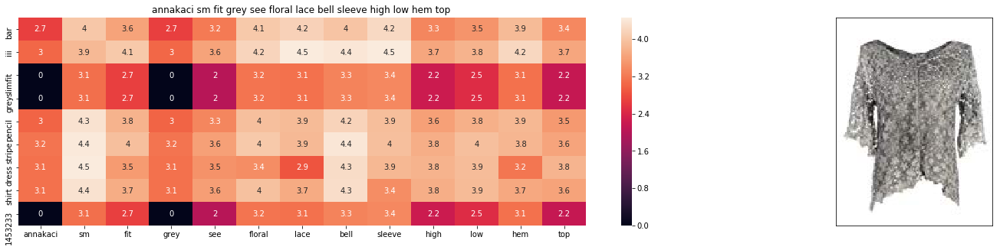

ASIN : B00NAEMMW2
Brand : Anna-Kaci
euclidean distance from input : 8.321078247958159


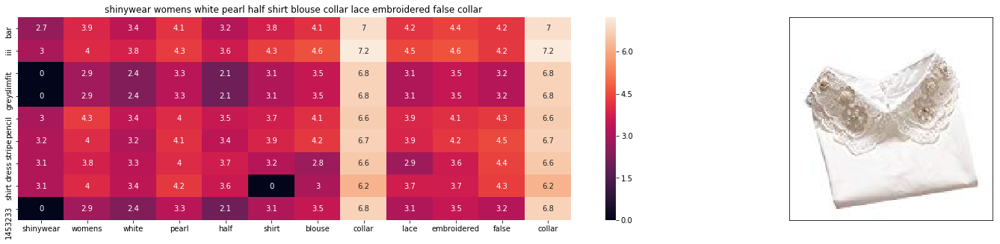

ASIN : B01LWYAF3R
Brand : Shinywear
euclidean distance from input : 8.321269858718331


In [137]:
idf_w2v_brand(937, 10, 15,5, 30)

(16042, 1)
(16042, 1)


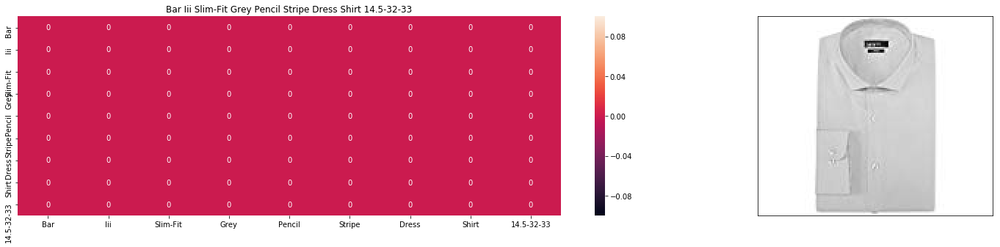

ASIN : B0153H0C7K
Brand : Bar III
euclidean distance from input : 0.0004143203794956207


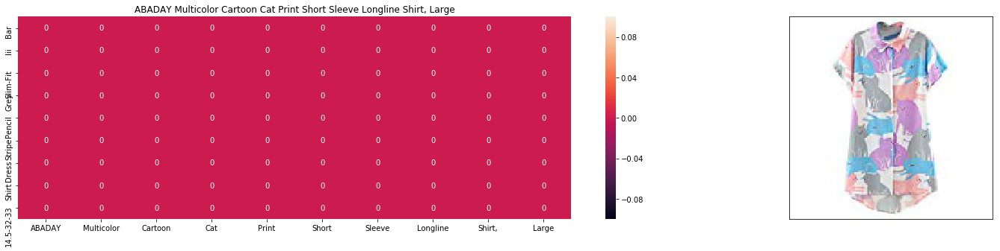

ASIN : B01CR57YY0
Brand : ABADAY
euclidean distance from input : 4.5587830734252925


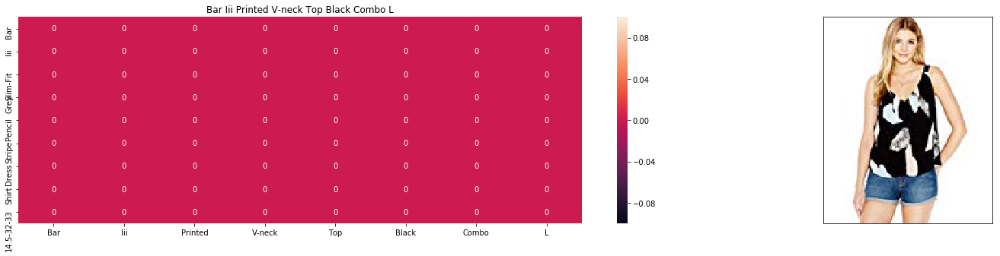

ASIN : B01KI9PNCM
Brand : Bar lll
euclidean distance from input : 6.374678679757808


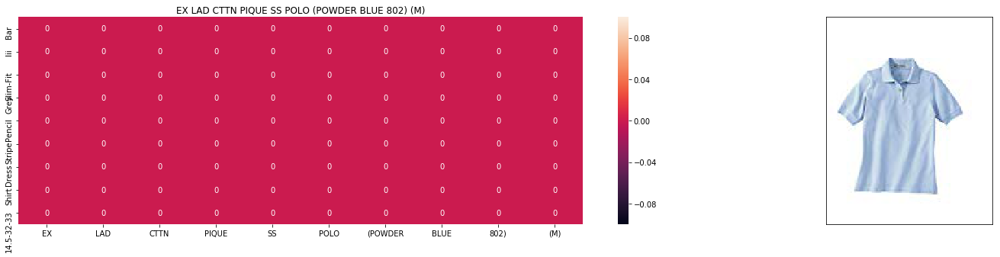

ASIN : B00ELC5OC2
Brand : Ash City
euclidean distance from input : 6.577020874167988


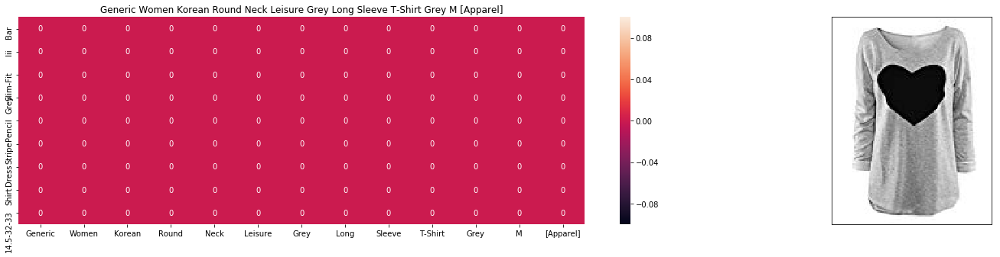

ASIN : B013LL0ENM
Brand : Absolutely
euclidean distance from input : 7.882054751505817


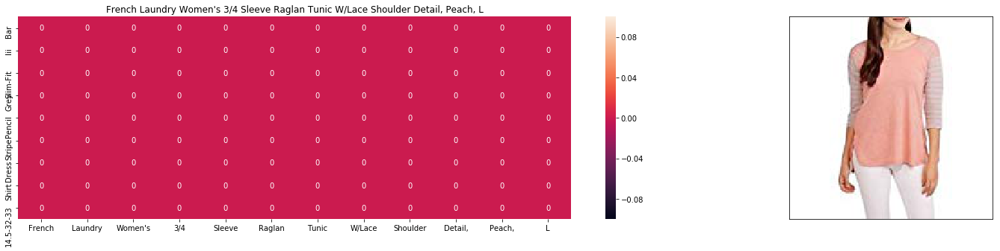

ASIN : B06Y5SZF7B
Brand : French Laundry
euclidean distance from input : 8.443356132651875


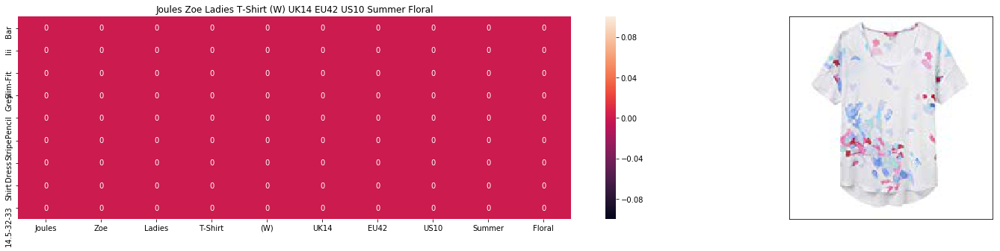

ASIN : B06XXJ2RQ4
Brand : Joules
euclidean distance from input : 8.465701484824727


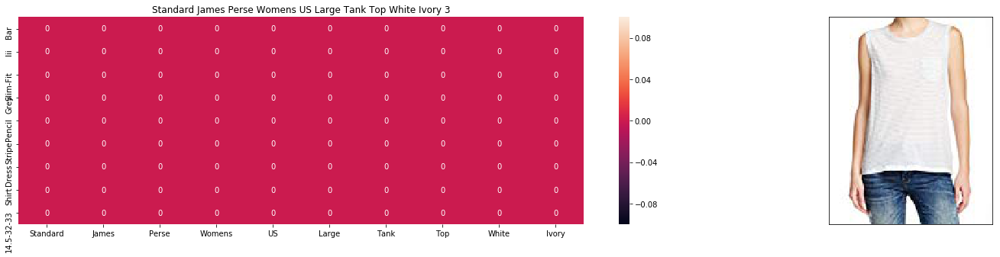

ASIN : B074SV25HV
Brand : Standard James Perse
euclidean distance from input : 8.479745037038558


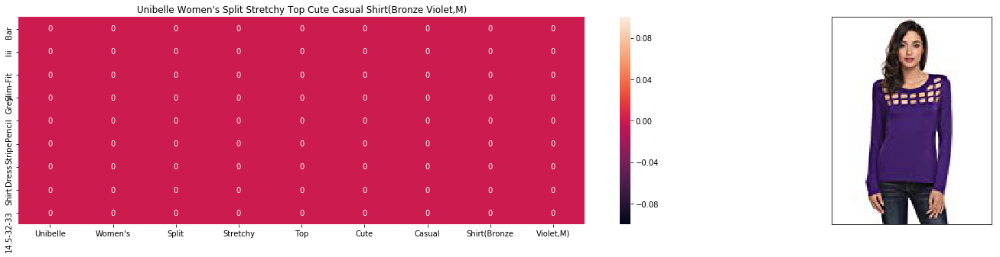

ASIN : B074PT5M59
Brand : Beautyuu
euclidean distance from input : 8.662025833274434


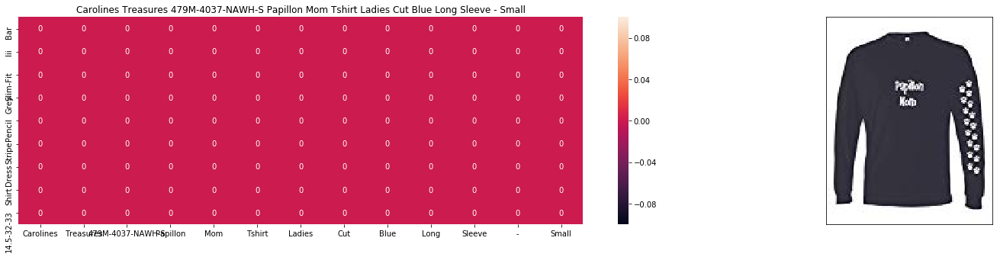

ASIN : B00J6ZNV3I
Brand : Caroline's Treasures
euclidean distance from input : 8.707922603566878


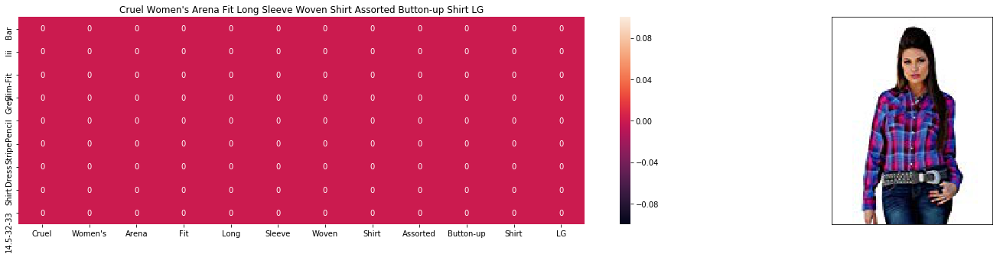

ASIN : B019OL33NG
Brand : Cruel
euclidean distance from input : 8.74442970290334


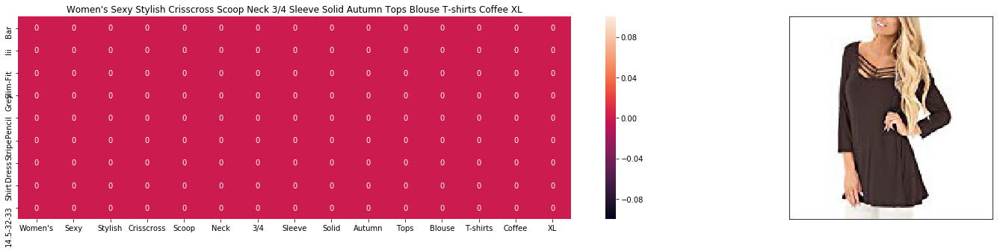

ASIN : B0755BYZW2
Brand : Jingying
euclidean distance from input : 8.768327279424831


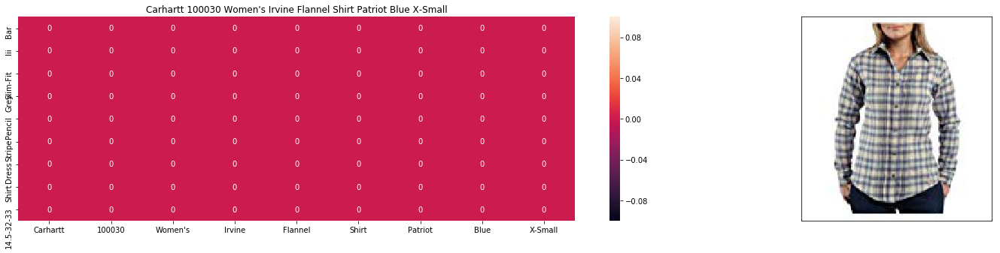

ASIN : B0088YO6BE
Brand : Carhartt
euclidean distance from input : 8.794560571050809


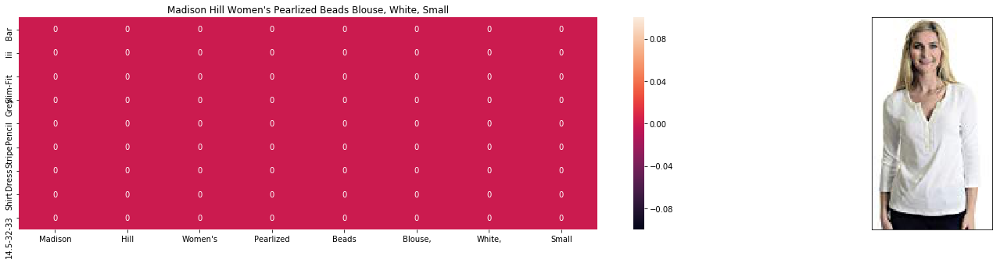

ASIN : B06XDL6V9W
Brand : madison & hill
euclidean distance from input : 8.817944412375995


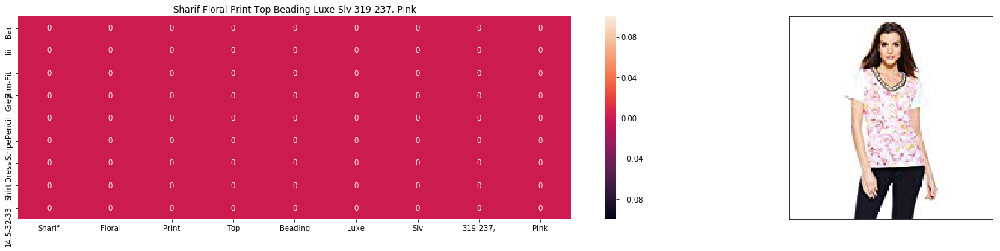

ASIN : B074LTBXR5
Brand : Sharif
euclidean distance from input : 8.83743700537698


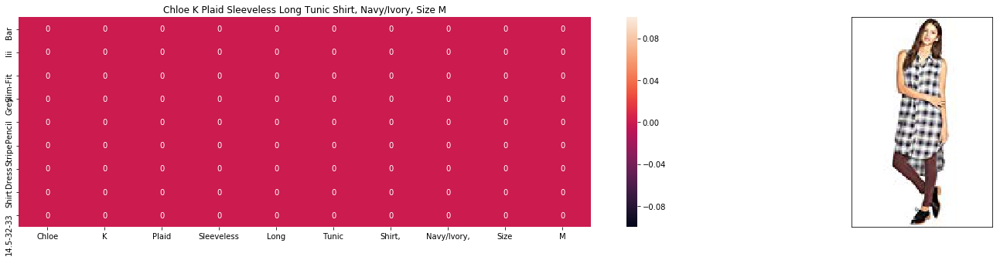

ASIN : B0732LF4Q3
Brand : Chloe K.
euclidean distance from input : 8.838154335166523


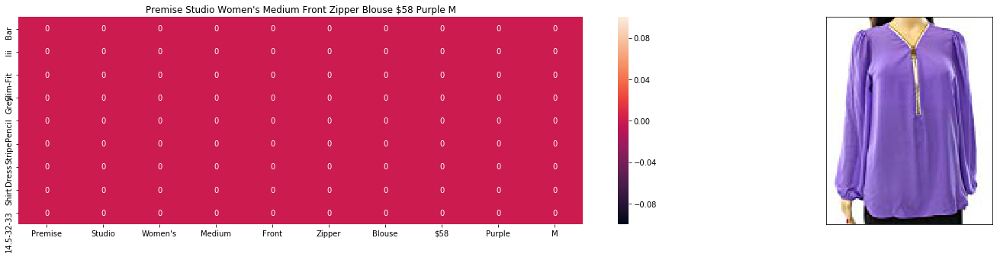

ASIN : B01M3YQ27P
Brand : Premise Studio
euclidean distance from input : 8.883903732444356


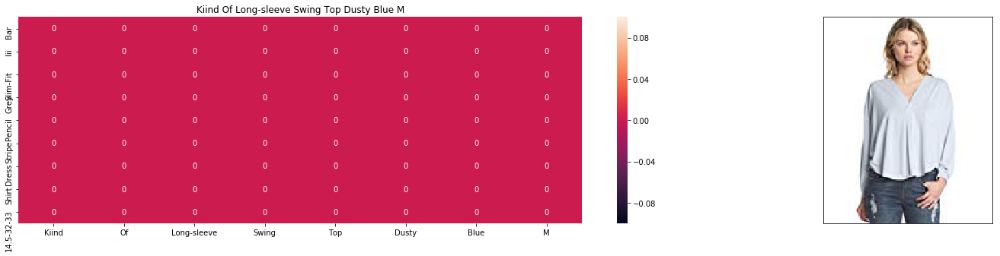

ASIN : B0142Q34LY
Brand : KIIND OF
euclidean distance from input : 8.907138214255879


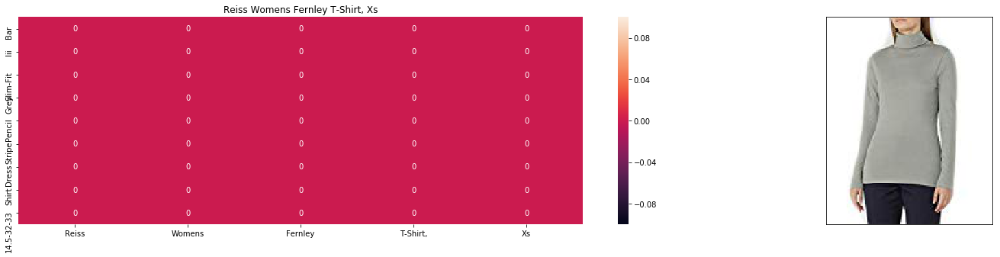

ASIN : B07577GBCJ
Brand : Reiss
euclidean distance from input : 8.923690133428739


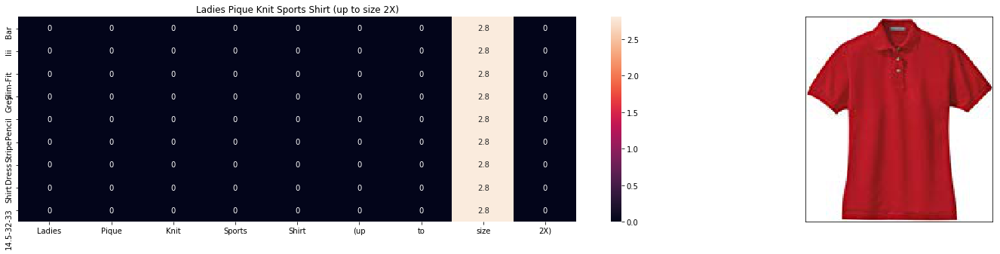

ASIN : B0028NOO4U
Brand : Bigmansland
euclidean distance from input : 8.937274627830098


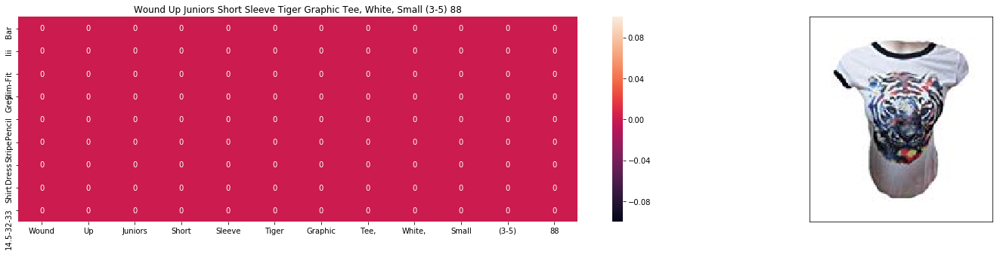

ASIN : B01F2UDRK2
Brand : Wound Up
euclidean distance from input : 8.98671642317922


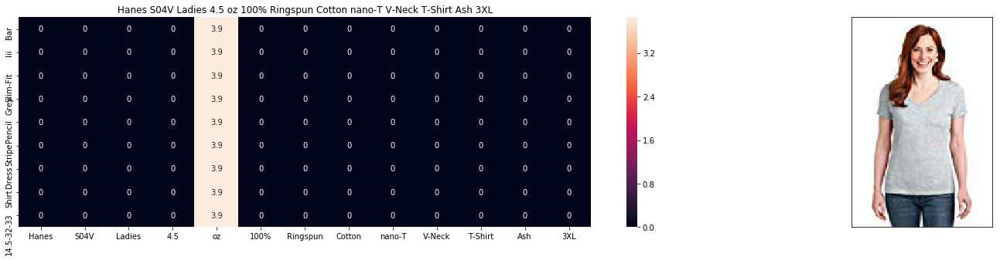

ASIN : B0159CM0X8
Brand : Hanes
euclidean distance from input : 8.994650497436524


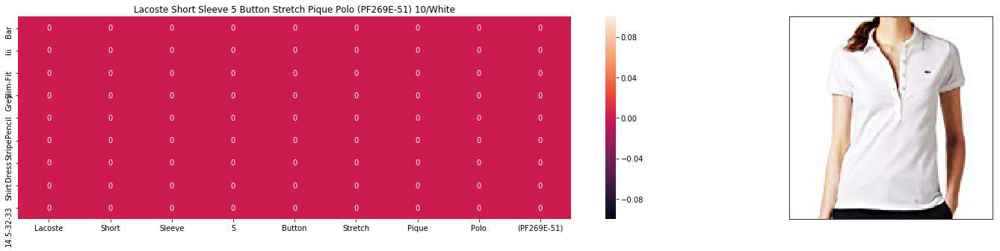

ASIN : B006WNYWT4
Brand : Lacoste
euclidean distance from input : 9.010739961004422


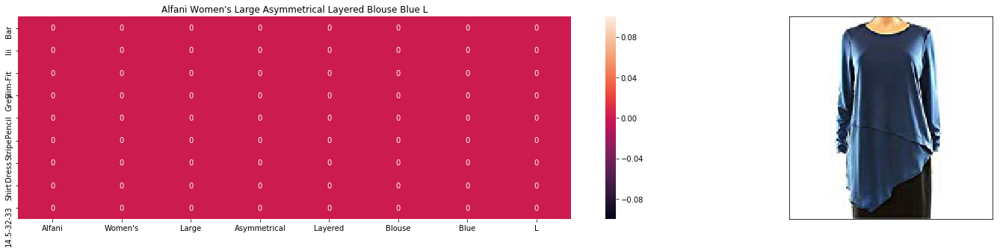

ASIN : B072N84K5G
Brand : Alfani
euclidean distance from input : 9.023904214239286


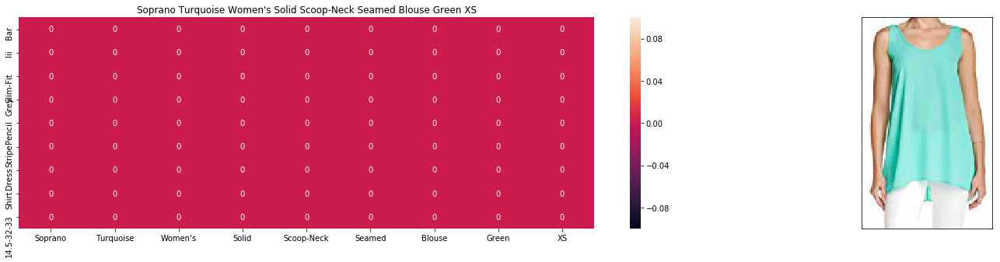

ASIN : B01JS7H6MA
Brand : Soprano
euclidean distance from input : 9.026711373663113


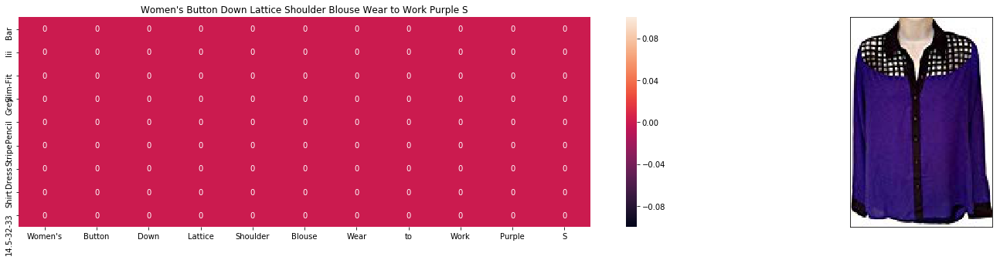

ASIN : B014G3SX1E
Brand : CHORD
euclidean distance from input : 9.033630523826192


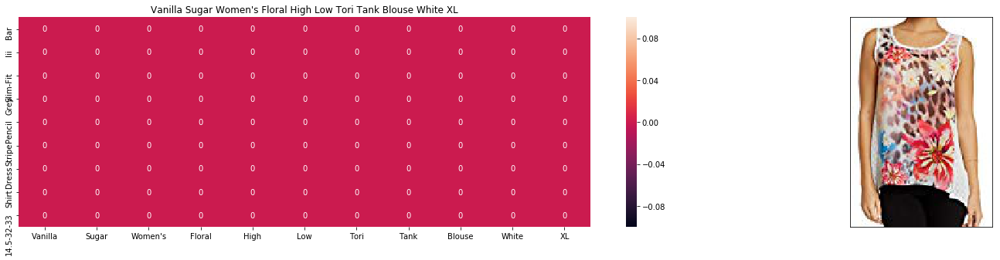

ASIN : B074WCPH8L
Brand : Vanilla Sugar
euclidean distance from input : 9.081260986472676


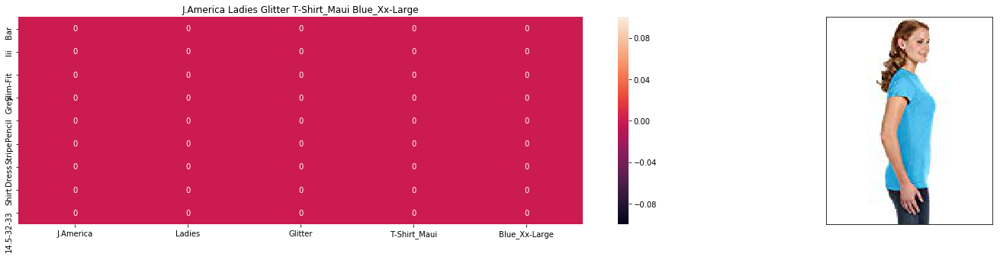

ASIN : B01DKIA3P0
Brand : J. America
euclidean distance from input : 9.082498321677754


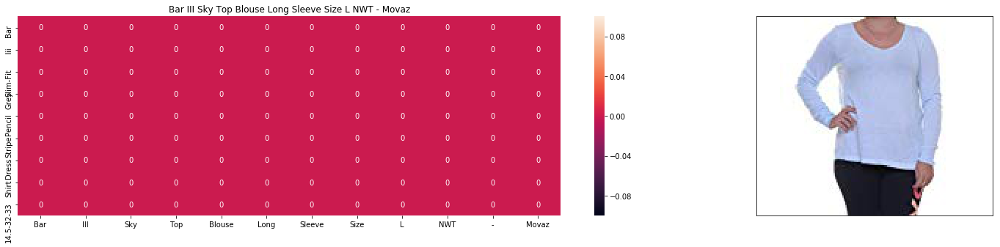

ASIN : B0748LNFLJ
Brand : Bar lll
euclidean distance from input : 9.102444373422358


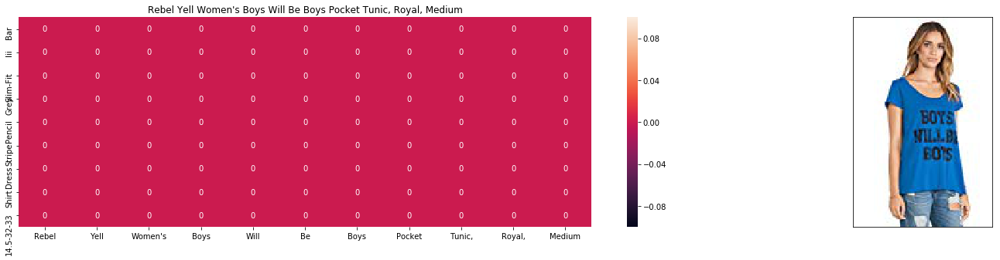

ASIN : B01CT4G42M
Brand : Rebel Yell
euclidean distance from input : 9.133162079001972


In [172]:
idf_w2v_brand(937, 15, 5,5, 30)

 # Steps to get the results

1.Intially the data is Preprocessed by removing the datapoints with NULL values in columns like price,color.

2.We,process hte data by removing the near duplicate items.

3.Text preprocessing
(i)Stop word removal
(ii)Stemming

4.Converting the text in the column into vector using idf weighted wordto vector.

5.we convert the brand and color of the datapoints into onehot encoding and stacking them to form a vector

6.we converted the image data into vectors using VGG-16 that gave 25088 dim dense vector for each image using CNN.

7.We,computed the weighted similarity between the vectors using text,brand&color,and image each of the these vectors given specific weights like w1,w2,w3.

Here,w1 refers to the weight given to the idf word to vec,w2 refers weight to the vector formed by text and color, w3 refers to the weight to the vector of images.
(w1 w2 w3)=( 5  5  5),(5  15 5),(5  5 15),(10 15 5).

In the first case all the three vectors are given equal weightage

In the second case color and brand are given more weightage than image and text data.

In the third case image data is given more preferance than extra fetures like color,brand and text data.

In the fourth case text is given preference than image and brand,color are given more weightage than text.

In the fifthe case text is given more preference.





   
   
   
   
   